<a href="https://colab.research.google.com/github/rubensolano2/GUIDES-AND-PRACTICES/blob/main/A_WALK_THROUGH_LANGUAGE_MODELS/SEQ2SEQ-TRANSFORMERS-LAMA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Este es un repositorio con toda la información de Facebook que me ha parecido interesante en su Papper LLama:
link: https://ai.facebook.com/blog/large-language-model-llama-meta-ai/

#OPTIMIZACIÓN DE LOS MODELOS DE LENGUAJE

El modelo llama se ha probado con diferente cantidad de Parametros:

de 7 a 65B de parametros

consiguiendo mejores resultados en su modelos 13B mejores que gpt3 siendo 10 veces mas pequeño

En su modelo de 65B ha conseguido igualar o superar a los grandes modelos de Lenguajes actuales

Los datos son los disponibles en varias páginas y no tiene nada de interesante

#Arquitecturas

#Generación de texto con un RNN

##CONFIGURACIÓN

LIBRERIAS

In [ ]:
import tensorflow as tf
import numpy as np
import os
import time

DATASET

In [ ]:
path_to_file = tf.keras.utils.get_file('shakespeare.txt', 'https://storage.googleapis.com/download.tensorflow.org/data/shakespeare.txt')

1115394/1115394 [==============================] - 0s 0us/step


LEER LOS DATOS

In [ ]:
# Read, then decode for py2 compat.
text = open(path_to_file, 'rb').read().decode(encoding='utf-8')
# length of text is the number of characters in it
print(f'Length of text: {len(text)} characters')

Length of text: 1115394 characters


In [ ]:
# Take a look at the first 250 characters in text
print(text[:250])

First Citizen:
Before we proceed any further, hear me speak.

All:
Speak, speak.

First Citizen:
You are all resolved rather to die than to famish?

All:
Resolved. resolved.

First Citizen:
First, you know Caius Marcius is chief enemy to the people.



In [ ]:
# The unique characters in the file
vocab = sorted(set(text))
print(f'{len(vocab)} unique characters')

65 unique characters


##PROCESAR EL TEXTO

###VECTORIZAR EL TEXTO

Antes del entrenamiento, debe convertir las cadenas en una representación numérica.

La capa tf.keras.layers.StringLookup puede convertir cada carácter en un ID numérico. Solo necesita que el texto se divida en tokens primero.

In [ ]:
example_texts = ['abcdefg', 'xyz']

chars = tf.strings.unicode_split(example_texts, input_encoding='UTF-8')
chars

<tf.RaggedTensor [[b'a', b'b', b'c', b'd', b'e', b'f', b'g'], [b'x', b'y', b'z']]>

Ahora cree la capa tf.keras.layers.StringLookup :

In [ ]:
ids_from_chars = tf.keras.layers.StringLookup(
    vocabulary=list(vocab), mask_token=None)

Se convierte de tokens a identificaciones de personajes:

In [ ]:
ids = ids_from_chars(chars)
ids

<tf.RaggedTensor [[40, 41, 42, 43, 44, 45, 46], [63, 64, 65]]>

Dado que el objetivo de este tutorial es generar texto, también será importante invertir esta representación y recuperar cadenas legibles por humanos a partir de ella. Para esto, puede usar tf.keras.layers.StringLookup(..., invert=True) .

- Nota: Aquí, en lugar de pasar el vocabulario original generado con sorted(set(text)) use el método get_vocabulary() de la capa tf.keras.layers.StringLookup para que los tokens [UNK] se configuren de la misma manera.

In [ ]:
chars_from_ids = tf.keras.layers.StringLookup(
    vocabulary=ids_from_chars.get_vocabulary(), invert=True, mask_token=None)

Esta capa recupera los caracteres de los vectores de ID y los devuelve como un tf.RaggedTensor de caracteres:

In [ ]:
chars = chars_from_ids(ids)
chars

<tf.RaggedTensor [[b'a', b'b', b'c', b'd', b'e', b'f', b'g'], [b'x', b'y', b'z']]>

Puede tf.strings.reduce_join para volver a unir los caracteres en cadenas.

In [ ]:
tf.strings.reduce_join(chars, axis=-1).numpy()

array([b'abcdefg', b'xyz'], dtype=object)

In [ ]:
def text_from_ids(ids):
  return tf.strings.reduce_join(chars_from_ids(ids), axis=-1)

La tarea de predicción


Dado un carácter, o una secuencia de caracteres, ¿cuál es el próximo carácter más probable? Esta es la tarea para la que está entrenando al modelo. La entrada al modelo será una secuencia de caracteres, y usted entrena el modelo para predecir la salida: el siguiente carácter en cada paso de tiempo.

Dado que los RNN mantienen un estado interno que depende de los elementos vistos anteriormente, dados todos los caracteres computados hasta este momento, ¿cuál es el siguiente carácter?



Cree ejemplos y objetivos de capacitación


A continuación, divida el texto en secuencias de ejemplo. Cada secuencia de entrada contendrá caracteres seq_length del texto.

Para cada secuencia de entrada, los objetivos correspondientes contienen la misma longitud de texto, excepto que se desplaza un carácter a la derecha.

Así que divide el texto en partes de seq_length+1 . Por ejemplo, digamos que seq_length es 4 y nuestro texto es "Hola". La secuencia de entrada sería "Hell" y la secuencia de destino "ello".

Para hacer esto, primero use la función tf.data.Dataset.from_tensor_slices para convertir el vector de texto en una secuencia de índices de caracteres.

In [ ]:
all_ids = ids_from_chars(tf.strings.unicode_split(text, 'UTF-8'))
all_ids

<tf.Tensor: shape=(1115394,), dtype=int64, numpy=array([19, 48, 57, ..., 46,  9,  1])>

In [ ]:
ids_dataset = tf.data.Dataset.from_tensor_slices(all_ids)

In [ ]:
for ids in ids_dataset.take(10):
    print(chars_from_ids(ids).numpy().decode('utf-8'))

F
i
r
s
t
 
C
i
t
i


In [ ]:
seq_length = 100
examples_per_epoch = len(text)//(seq_length+1)

El método por batch le permite convertir fácilmente estos caracteres individuales en secuencias del tamaño deseado.

In [ ]:
sequences = ids_dataset.batch(seq_length+1, drop_remainder=True)

for seq in sequences.take(1):
  print(chars_from_ids(seq))

tf.Tensor(
[b'F' b'i' b'r' b's' b't' b' ' b'C' b'i' b't' b'i' b'z' b'e' b'n' b':'
 b'\n' b'B' b'e' b'f' b'o' b'r' b'e' b' ' b'w' b'e' b' ' b'p' b'r' b'o'
 b'c' b'e' b'e' b'd' b' ' b'a' b'n' b'y' b' ' b'f' b'u' b'r' b't' b'h'
 b'e' b'r' b',' b' ' b'h' b'e' b'a' b'r' b' ' b'm' b'e' b' ' b's' b'p'
 b'e' b'a' b'k' b'.' b'\n' b'\n' b'A' b'l' b'l' b':' b'\n' b'S' b'p' b'e'
 b'a' b'k' b',' b' ' b's' b'p' b'e' b'a' b'k' b'.' b'\n' b'\n' b'F' b'i'
 b'r' b's' b't' b' ' b'C' b'i' b't' b'i' b'z' b'e' b'n' b':' b'\n' b'Y'
 b'o' b'u' b' '], shape=(101,), dtype=string)


Es más fácil ver qué está haciendo esto si vuelve a unir los tokens en cadenas:

In [ ]:
for seq in sequences.take(5):
  print(text_from_ids(seq).numpy())

b'First Citizen:\nBefore we proceed any further, hear me speak.\n\nAll:\nSpeak, speak.\n\nFirst Citizen:\nYou '
b'are all resolved rather to die than to famish?\n\nAll:\nResolved. resolved.\n\nFirst Citizen:\nFirst, you k'
b"now Caius Marcius is chief enemy to the people.\n\nAll:\nWe know't, we know't.\n\nFirst Citizen:\nLet us ki"
b"ll him, and we'll have corn at our own price.\nIs't a verdict?\n\nAll:\nNo more talking on't; let it be d"
b'one: away, away!\n\nSecond Citizen:\nOne word, good citizens.\n\nFirst Citizen:\nWe are accounted poor citi'


Para el entrenamiento, necesitará un conjunto de datos de (input, label) pares. Donde input y label son secuencias. En cada paso de tiempo, la entrada es el carácter actual y la etiqueta es el siguiente carácter.

Aquí hay una función que toma una secuencia como entrada, la duplica y la cambia para alinear la entrada y la etiqueta para cada paso de tiempo:

In [ ]:
def split_input_target(sequence):
    input_text = sequence[:-1]
    target_text = sequence[1:]
    return input_text, target_text

In [ ]:
split_input_target(list("Tensorflow"))

(['T', 'e', 'n', 's', 'o', 'r', 'f', 'l', 'o'],
 ['e', 'n', 's', 'o', 'r', 'f', 'l', 'o', 'w'])

In [ ]:
dataset = sequences.map(split_input_target)

In [ ]:
for input_example, target_example in dataset.take(1):
    print("Input :", text_from_ids(input_example).numpy())
    print("Target:", text_from_ids(target_example).numpy())

Input : b'First Citizen:\nBefore we proceed any further, hear me speak.\n\nAll:\nSpeak, speak.\n\nFirst Citizen:\nYou'
Target: b'irst Citizen:\nBefore we proceed any further, hear me speak.\n\nAll:\nSpeak, speak.\n\nFirst Citizen:\nYou '


Crear lotes de entrenamiento

Usó tf.data para dividir el texto en secuencias manejables. Pero antes de introducir estos datos en el modelo, debe mezclar los datos y empaquetarlos en lotes.

In [ ]:
# Batch size
BATCH_SIZE = 64

# Buffer size to shuffle the dataset
# (TF data is designed to work with possibly infinite sequences,
# so it doesn't attempt to shuffle the entire sequence in memory. Instead,
# it maintains a buffer in which it shuffles elements).
BUFFER_SIZE = 10000

dataset = (
    dataset
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(tf.data.experimental.AUTOTUNE))

dataset

<PrefetchDataset element_spec=(TensorSpec(shape=(64, 100), dtype=tf.int64, name=None), TensorSpec(shape=(64, 100), dtype=tf.int64, name=None))>

###construir el modelo

Esta sección define el modelo como una subclase keras.Model (para obtener más información, consulte Creación de nuevas capas y modelos a través de subclases ).

Este modelo tiene tres capas:

- tf.keras.layers.Embedding : La capa de entrada. Una tabla de búsqueda entrenable que asignará cada ID de carácter a un vector con dimensiones embedding_dim ;
- tf.keras.layers.GRU : un tipo de RNN con units=rnn_units (también puede usar una capa LSTM aquí).
- tf.keras.layers.Dense : la capa de salida, con salidas vocab_size . Produce un logit por cada carácter del vocabulario. Estos son el log-verosimilitud de cada carácter según el modelo.

In [ ]:
# Length of the vocabulary in chars
vocab_size = len(vocab)

# The embedding dimension
embedding_dim = 256

# Number of RNN units
rnn_units = 1024

In [ ]:
class MyModel(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, rnn_units):
    super().__init__(self)
    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(rnn_units,
                                   return_sequences=True,
                                   return_state=True)
    self.dense = tf.keras.layers.Dense(vocab_size)

  def call(self, inputs, states=None, return_state=False, training=False):
    x = inputs
    x = self.embedding(x, training=training)
    if states is None:
      states = self.gru.get_initial_state(x)
    x, states = self.gru(x, initial_state=states, training=training)
    x = self.dense(x, training=training)

    if return_state:
      return x, states
    else:
      return x

In [ ]:
model = MyModel(
    # Be sure the vocabulary size matches the `StringLookup` layers.
    vocab_size=len(ids_from_chars.get_vocabulary()),
    embedding_dim=embedding_dim,
    rnn_units=rnn_units)

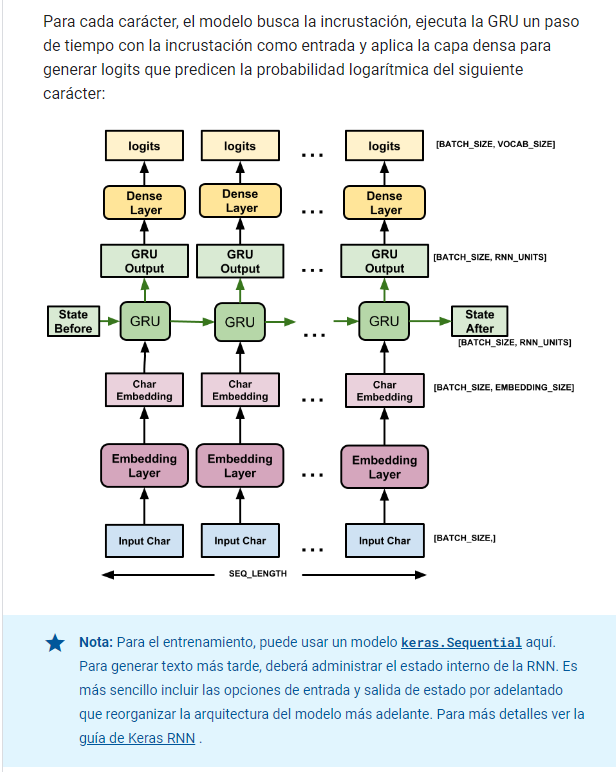

Prueba el modelo

Ahora ejecute el modelo para ver que se comporta como se esperaba.

Primero verifique la forma de la salida:

In [ ]:
for input_example_batch, target_example_batch in dataset.take(1):
    example_batch_predictions = model(input_example_batch)
    print(example_batch_predictions.shape, "# (batch_size, sequence_length, vocab_size)")

(64, 100, 66) # (batch_size, sequence_length, vocab_size)


En el ejemplo anterior, la longitud de secuencia de la entrada es 100 , pero el modelo se puede ejecutar en entradas de cualquier longitud:

In [ ]:
model.summary()

Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       multiple                  16896     
                                                                 
 gru (GRU)                   multiple                  3938304   
                                                                 
 dense (Dense)               multiple                  67650     
                                                                 
Total params: 4,022,850
Trainable params: 4,022,850
Non-trainable params: 0
_________________________________________________________________


Para obtener predicciones reales del modelo, debe muestrear la distribución de salida para obtener índices de caracteres reales. Esta distribución está definida por los logits sobre el vocabulario de caracteres.

Nota: es importante tomar muestras de esta distribución, ya que tomar el argmax de la distribución puede hacer que el modelo se atasque fácilmente en un bucle.

Pruébelo para el primer ejemplo en el lote:

In [ ]:
sampled_indices = tf.random.categorical(example_batch_predictions[0], num_samples=1)
sampled_indices = tf.squeeze(sampled_indices, axis=-1).numpy()

Esto nos da, en cada paso de tiempo, una predicción del siguiente índice de caracteres:

In [ ]:
sampled_indices

array([34,  4,  8, 42,  0,  1, 15, 33, 14, 25, 36, 37, 37, 50, 61,  8, 37,
       48, 54, 46, 50, 25, 45,  2, 44, 63, 63, 42, 15, 44, 45, 30, 12, 12,
        3, 47, 24, 62, 45,  5, 14, 32,  5, 65, 49, 65, 33, 50, 14, 18, 24,
       27, 54,  2,  1, 52, 59, 38, 20, 28, 64, 37, 28, 57, 43, 53, 45, 31,
       45, 34, 54, 12, 22, 19, 29, 39, 49, 11, 53, 43,  2, 32, 18, 48, 39,
        2, 52, 63, 62, 60,  3, 17, 63,  0, 30, 40, 61, 60, 45, 61])

Decodifique estos para ver el texto predicho por este modelo no entrenado:

In [ ]:
print("Input:\n", text_from_ids(input_example_batch[0]).numpy())
print()
print("Next Char Predictions:\n", text_from_ids(sampled_indices).numpy())

Input:
 b"thus have wrought you,--for the stone is mine--\nI'ld not have show'd it.\n\nLEONTES:\nDo not draw the c"

Next Char Predictions:
 b'U$-c[UNK]\nBTALWXXkv-XiogkLf exxcBefQ;;!hKwf&AS&zjzTkAEKNo \nmtYGOyXOrdnfRfUo;IFPZj:nd SEiZ mxwu!Dx[UNK]Qavufv'


###entrenar al modelo

En este punto, el problema se puede tratar como un problema de clasificación estándar. Dado el estado anterior de RNN y la entrada de este paso de tiempo, prediga la clase del siguiente carácter.

Adjunte un optimizador y una función de pérdida

La función de pérdida estándar tf.keras.losses.sparse_categorical_crossentropy funciona en este caso porque se aplica en la última dimensión de las predicciones.

Debido a que su modelo devuelve logits, debe configurar el indicador from_logits .

In [ ]:
loss = tf.losses.SparseCategoricalCrossentropy(from_logits=True)

In [ ]:
example_batch_mean_loss = loss(target_example_batch, example_batch_predictions)
print("Prediction shape: ", example_batch_predictions.shape, " # (batch_size, sequence_length, vocab_size)")
print("Mean loss:        ", example_batch_mean_loss)

Prediction shape:  (64, 100, 66)  # (batch_size, sequence_length, vocab_size)
Mean loss:         tf.Tensor(4.1890483, shape=(), dtype=float32)


Un modelo recién inicializado no debería estar demasiado seguro de sí mismo, todos los logits de salida deberían tener magnitudes similares. Para confirmar esto puedes comprobar que la exponencial de la pérdida media es aproximadamente igual al tamaño del vocabulario. Una pérdida mucho mayor significa que el modelo está seguro de sus respuestas incorrectas y está mal inicializado:

In [ ]:
tf.exp(example_batch_mean_loss).numpy()

65.959984

Configure el procedimiento de entrenamiento utilizando el método tf.keras.Model.compile . Utilice tf.keras.optimizers.Adam con argumentos predeterminados y la función de pérdida.

In [ ]:
model.compile(optimizer='adam', loss=loss)

Configurar puntos de control

Use un tf.keras.callbacks.ModelCheckpoint para asegurarse de que los puntos de control se guarden durante el entrenamiento:

In [ ]:
# Directory where the checkpoints will be saved
checkpoint_dir = './training_checkpoints'
# Name of the checkpoint files
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_{epoch}")

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_prefix,
    save_weights_only=True)

Ejecutar el entrenamiento

Para mantener un tiempo de entrenamiento razonable, use 10 épocas para entrenar el modelo. En Colab, configure el tiempo de ejecución en GPU para un entrenamiento más rápido.

In [ ]:
EPOCHS = 20

In [ ]:
history = model.fit(dataset, epochs=EPOCHS, callbacks=[checkpoint_callback])

Epoch 1/20
172/172 [==============================] - 15s 57ms/step - loss: 2.7045
Epoch 2/20
172/172 [==============================] - 11s 53ms/step - loss: 1.9819
Epoch 3/20
172/172 [==============================] - 11s 53ms/step - loss: 1.7053
Epoch 4/20
172/172 [==============================] - 16s 63ms/step - loss: 1.5473
Epoch 5/20
172/172 [==============================] - 14s 60ms/step - loss: 1.4488
Epoch 6/20
172/172 [==============================] - 13s 60ms/step - loss: 1.3829
Epoch 7/20
172/172 [==============================] - 13s 59ms/step - loss: 1.3304
Epoch 8/20
172/172 [==============================] - 14s 61ms/step - loss: 1.2859
Epoch 9/20
172/172 [==============================] - 13s 62ms/step - loss: 1.2449
Epoch 10/20
172/172 [==============================] - 14s 59ms/step - loss: 1.2068
Epoch 11/20
172/172 [==============================] - 14s 65ms/step - loss: 1.1663
Epoch 12/20
172/172 [==============================] - 13s 60ms/step - loss: 1.1261
E

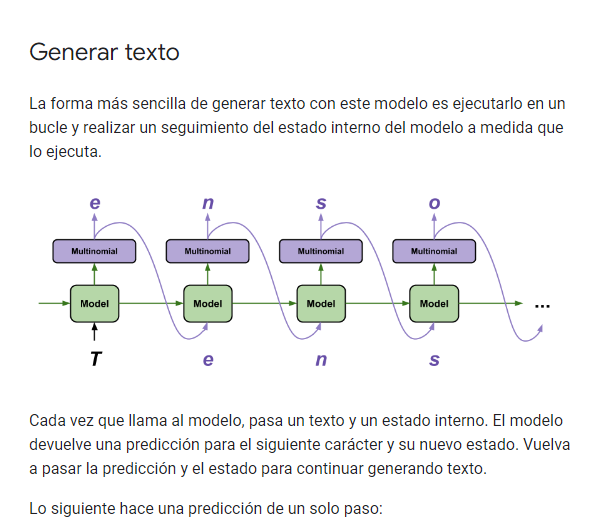

In [ ]:
class OneStep(tf.keras.Model):
  def __init__(self, model, chars_from_ids, ids_from_chars, temperature=1.0):
    super().__init__()
    self.temperature = temperature
    self.model = model
    self.chars_from_ids = chars_from_ids
    self.ids_from_chars = ids_from_chars

    # Create a mask to prevent "[UNK]" from being generated.
    skip_ids = self.ids_from_chars(['[UNK]'])[:, None]
    sparse_mask = tf.SparseTensor(
        # Put a -inf at each bad index.
        values=[-float('inf')]*len(skip_ids),
        indices=skip_ids,
        # Match the shape to the vocabulary
        dense_shape=[len(ids_from_chars.get_vocabulary())])
    self.prediction_mask = tf.sparse.to_dense(sparse_mask)

  @tf.function
  def generate_one_step(self, inputs, states=None):
    # Convert strings to token IDs.
    input_chars = tf.strings.unicode_split(inputs, 'UTF-8')
    input_ids = self.ids_from_chars(input_chars).to_tensor()

    # Run the model.
    # predicted_logits.shape is [batch, char, next_char_logits]
    predicted_logits, states = self.model(inputs=input_ids, states=states,
                                          return_state=True)
    # Only use the last prediction.
    predicted_logits = predicted_logits[:, -1, :]
    predicted_logits = predicted_logits/self.temperature
    # Apply the prediction mask: prevent "[UNK]" from being generated.
    predicted_logits = predicted_logits + self.prediction_mask

    # Sample the output logits to generate token IDs.
    predicted_ids = tf.random.categorical(predicted_logits, num_samples=1)
    predicted_ids = tf.squeeze(predicted_ids, axis=-1)

    # Convert from token ids to characters
    predicted_chars = self.chars_from_ids(predicted_ids)

    # Return the characters and model state.
    return predicted_chars, states

In [ ]:
one_step_model = OneStep(model, chars_from_ids, ids_from_chars)

Ejecútelo en un bucle para generar algo de texto. Mirando el texto generado, verá que el modelo sabe cuándo usar mayúsculas, hacer párrafos e imita un vocabulario de escritura similar al de Shakespeare. Con el pequeño número de épocas de entrenamiento, aún no ha aprendido a formar oraciones coherentes.

In [ ]:
start = time.time()
states = None
next_char = tf.constant(['ROMEO:'])
result = [next_char]

for n in range(1000):
  next_char, states = one_step_model.generate_one_step(next_char, states=states)
  result.append(next_char)

result = tf.strings.join(result)
end = time.time()
print(result[0].numpy().decode('utf-8'), '\n\n' + '_'*80)
print('\nRun time:', end - start)

ROMEO:
Ay, follow you.

Provost:
And, if the day is on unscur! and no man ever dam
intents, impeachest disposition, by your own.
What makes your daughter is Katharina learned.
Courage! might dive this churt? do our mistress,
Her suit resolve you left a man's wife is interpound xouls,
But sunn you from whence is any in Vincenter
As for my presence, where I must be, let's har
behold his bastaph:--for he indeed: he is but a custom,
But nathin be wild and will not see thee mother,
Our high; go to Norfolk desire you:
I'll follow you, sometimes this land of our incient,
Neighbours nothing but in your high hath unreeded,
Amence of napitor's threast, the father of thy soly.

Nurse:

Nurse:
Nor I.

CLARENCE:
By the sentence of his name; he's gone to have.
See, on her king indeed.

DORSET:
I thank you, good God, for whom I am in soul.
Vake next our tiders and quit my plate to them as they
did but one skill we his dear mornight-day,
Death like a poolet am out of shall fold,
accuse his eye, as if 

Lo más fácil que puede hacer para mejorar los resultados es entrenarlo durante más tiempo (pruebe EPOCHS = 30 ).

También puede experimentar con una cadena de inicio diferente, intente agregar otra capa RNN para mejorar la precisión del modelo o ajustar el parámetro de temperatura para generar predicciones más o menos aleatorias.

Si desea que el modelo genere texto más rápido , lo más fácil que puede hacer es generar el texto por lotes. En el siguiente ejemplo, el modelo genera 5 salidas aproximadamente en el mismo tiempo que se tardó en generar 1 arriba

In [ ]:
start = time.time()
states = None
next_char = tf.constant(['ROMEO:', 'ROMEO:', 'ROMEO:', 'ROMEO:', 'ROMEO:'])
result = [next_char]

for n in range(1000):
  next_char, states = one_step_model.generate_one_step(next_char, states=states)
  result.append(next_char)

result = tf.strings.join(result)
end = time.time()
print(result, '\n\n' + '_'*80)
print('\nRun time:', end - start)

tf.Tensor(
[b"ROMEO:\nCome, sir, a noble and the queen's attend on here.\n\nHENRY BOLINGBROKE:\nSweetly, have talk'd some house, in the reason\nFor meech and now by gaunt: is it next,\nYou had not-like bearing wonder of the whole,\nLess imposed at grace and tales by me?\n\nRIVERS:\nThen he shall close the market-place nor power to this.\nFar we like in great turned.\n\nSICINIUS:\nWas efter so, my lord:\nWhat's your wife?\n\nPedant:\nShe's year-blood upon a soldier's head, say.\n\nOXFORD:\nIn traitor, Marcius, they learn crag-gold\nnot what we warping me?\n\nBISHOP OF CALLLLY:\nMy lord; why stay he hath appears nought:\nBut elbow it was, or else twenty years,\nAnd rike forgery all intolment. Come, come, go a deed.\n\nKING HENRY VI:\nHave done thee speak briefly we are upon you all:\nThe prince my father, or the throwers, rove,\nUnder him o'clock?\nWhere are those joy\nNothing have nothing else beloved of;\nYet, in the seench like aduet: may I change you, sir,\nHe thinks it with a little

Exportar el generador

Este modelo de un solo paso se puede guardar y restaurar fácilmente, lo que le permite usarlo en cualquier lugar donde se acepte un tf.saved_model .

In [ ]:
tf.saved_model.save(one_step_model, 'one_step')
one_step_reloaded = tf.saved_model.load('one_step')

In [ ]:
states = None
next_char = tf.constant(['ROMEO:'])
result = [next_char]

for n in range(100):
  next_char, states = one_step_reloaded.generate_one_step(next_char, states=states)
  result.append(next_char)

print(tf.strings.join(result)[0].numpy().decode("utf-8"))

ROMEO:
Knock the traitor, kneel doth kiscA: the duke a
bely shadows of the Tower, of tackly: 'tis nooth, b


###Avanzado: Entrenamiento Personalizado

l procedimiento de entrenamiento anterior es simple, pero no le da mucho control. Utiliza el maestro forzado que evita que las malas predicciones se retroalimenten al modelo, por lo que el modelo nunca aprende a recuperarse de los errores.

Entonces, ahora que ha visto cómo ejecutar el modelo manualmente, ahora implementará el ciclo de entrenamiento. Esto brinda un punto de partida si, por ejemplo, desea implementar el aprendizaje del plan de estudios para ayudar a estabilizar la salida de bucle abierto del modelo.

La parte más importante de un ciclo de entrenamiento personalizado es la función de paso de entrenamiento.

Use tf.GradientTape para rastrear los degradados. Puede obtener más información sobre este enfoque leyendo la guía de ejecución ansiosa .

El procedimiento básico es:



1.   Ejecute el modelo y calcule la pérdida bajo un tf.GradientTape .
2.   Calcule las actualizaciones y aplíquelas al modelo utilizando el optimizador.






In [ ]:
class CustomTraining(MyModel):
  @tf.function
  def train_step(self, inputs):
      inputs, labels = inputs
      with tf.GradientTape() as tape:
          predictions = self(inputs, training=True)
          loss = self.loss(labels, predictions)
      grads = tape.gradient(loss, model.trainable_variables)
      self.optimizer.apply_gradients(zip(grads, model.trainable_variables))

      return {'loss': loss}

La implementación anterior del método train_step sigue las convenciones train_step de Keras . Esto es opcional, pero le permite cambiar el comportamiento del paso de tren y seguir usando los métodos Model.compile y Model.fit de keras.

In [ ]:
model = CustomTraining(
    vocab_size=len(ids_from_chars.get_vocabulary()),
    embedding_dim=embedding_dim,
    rnn_units=rnn_units)

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

In [ ]:
model.fit(dataset, epochs=1)

O si necesita más control, puede escribir su propio ciclo de entrenamiento personalizado completo:

In [ ]:
EPOCHS = 10

mean = tf.metrics.Mean()

for epoch in range(EPOCHS):
    start = time.time()

    mean.reset_states()
    for (batch_n, (inp, target)) in enumerate(dataset):
        logs = model.train_step([inp, target])
        mean.update_state(logs['loss'])

        if batch_n % 50 == 0:
            template = f"Epoch {epoch+1} Batch {batch_n} Loss {logs['loss']:.4f}"
            print(template)

    # saving (checkpoint) the model every 5 epochs
    if (epoch + 1) % 5 == 0:
        model.save_weights(checkpoint_prefix.format(epoch=epoch))

    print()
    print(f'Epoch {epoch+1} Loss: {mean.result().numpy():.4f}')
    print(f'Time taken for 1 epoch {time.time() - start:.2f} sec')
    print("_"*80)

model.save_weights(checkpoint_prefix.format(epoch=epoch))

#TRADUCTOR DE TEXTO SEQ2SEQ

### modelos de codificiación y decodificación

Teoria

Los modelos seq2seq (Secuaencia a Secuencia) consisten en dos subredes, el **codificador** y el **decodificador**.

El codificador, se situa a la izquierda, recive la secuencia de lenguaje como input y produce como resultado, una representación compacta de la secuencia del input, intentando condensar o resumir toda su información.Entonces esa salida se convierte en una entrada o estado inicial del descodificador, que también puede recibir otra entrada externa.


En cada paso temporal, el descodificador genera un elemento de su secuencia de salida basándose en la entrada recibida y en su estado actual, además de actualizar su propio estado para el siguiente paso temporal.




El tamaño de la secuencia del input y el output son fijas pero no iguales, la longitud de la secuencia puede ser diferente en la salida

El punto crítico de este modelo es cómo conseguir que el codificador proporcione la representación más completa y significativa de su secuencia de entrada en un único elemento de salida al descodificador, porque este vector o estado es la única información que el descodificador recibirá de la entrada para generar la salida correspondiente. Cuanto más larga sea la entrada, más difícil será comprimirla en un único vector.

link: http://static.googleusercontent.com/media/research.google.com/es//pubs/archive/43155.pdf

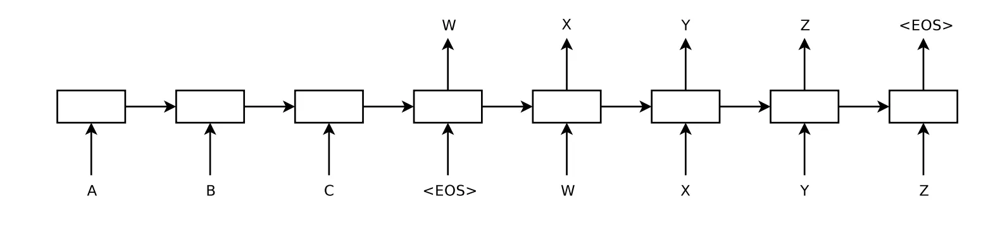

Práctica

###LIMPIEZA DE DATOS

link tutorial: https://www.tensorflow.org/text/tutorials/nmt_with_attention?hl=es-419

INSTALAR PAQUETE TENSORFLOW ESPECIALIZADO EN TEXTO

In [ ]:
!pip install tensorflow_text

CARGAR LIBRERIAS

In [ ]:
import numpy as np

import typing
from typing import Any, Tuple

import tensorflow as tf

import tensorflow_text as tf_text

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

La variable use_builtins es un parámetro opcional que se puede utilizar al crear un entorno de ejecución de Python en Google Colab. Este parámetro indica si se deben usar las funciones integradas de Python, como print, len, etc., en lugar de las funciones personalizadas implementadas por Google Colab.

Cuando use_builtins=True, el entorno de ejecución utiliza las funciones integradas de Python en lugar de las funciones personalizadas de Colab

In [ ]:
use_builtins = True

CARGA DE DATOS

In [ ]:
# Download the file
import pathlib

path_to_zip = tf.keras.utils.get_file(
    'spa-eng.zip', origin='http://storage.googleapis.com/download.tensorflow.org/data/spa-eng.zip',
    extract=True)

path_to_file = pathlib.Path(path_to_zip).parent/'spa-eng/spa.txt'

In [ ]:
def load_data(path):
  text = path.read_text(encoding='utf-8')

  lines = text.splitlines()
  pairs = [line.split('\t') for line in lines]

  inp = [inp for targ, inp in pairs]
  targ = [targ for targ, inp in pairs]

  return targ, inp

INPUT

In [ ]:
targ, inp = load_data(path_to_file)
print(inp[-1])

Si quieres sonar como un hablante nativo, debes estar dispuesto a practicar diciendo la misma frase una y otra vez de la misma manera en que un músico de banjo practica el mismo fraseo una y otra vez hasta que lo puedan tocar correctamente y en el tiempo esperado.


TARGET

In [ ]:
print(targ[-1])

If you want to sound like a native speaker, you must be willing to practice saying the same sentence over and over in the same way that banjo players practice the same phrase over and over until they can play it correctly and at the desired tempo.


Crea un conjunto de datos tf.data

In [ ]:
BUFFER_SIZE = len(inp)
BATCH_SIZE = 64

dataset = tf.data.Dataset.from_tensor_slices((inp, targ)).shuffle(BUFFER_SIZE)
dataset = dataset.batch(BATCH_SIZE)

In [ ]:
for example_input_batch, example_target_batch in dataset.take(1):
  print(example_input_batch[:5])
  print()
  print(example_target_batch[:5])
  break

tf.Tensor(
[b'Debes recordar eso.' b'Viven en una casa alquilada.'
 b'Te lo explicar\xc3\xa9.' b'\xc2\xbfAlguien le conoce?'
 b'S\xc3\xa9 que nos puedes ayudar.'], shape=(5,), dtype=string)

tf.Tensor(
[b'You should remember that.' b'They live in a rented house.'
 b"I'll explain it to you." b'Does anybody know him?'
 b'I know you can help us.'], shape=(5,), dtype=string)


Estandarización

El primer paso es la normalización Unicode para dividir los caracteres acentuados y reemplazar los caracteres de compatibilidad con sus equivalentes ASCII.

El tensorflow_text paquete contiene una operación de normalizar Unicode:

La primera línea está codificada en UTF-8, que es un formato común para intercambiar datos en línea, mientras que la segunda línea está codificada en Unicode, que es un estándar para representar caracteres en todos los idiomas.

In [ ]:
example_text = tf.constant('¿Todavía está en casa?')

print(example_text.numpy())
print(tf_text.normalize_utf8(example_text, 'NFKD').numpy())

b'\xc2\xbfTodav\xc3\xada est\xc3\xa1 en casa?'
b'\xc2\xbfTodavi\xcc\x81a esta\xcc\x81 en casa?'


normalización del texto

In [ ]:
def tf_lower_and_split_punct(text):
  # Split accecented characters.
  text = tf_text.normalize_utf8(text, 'NFKD')
  text = tf.strings.lower(text)
  # Keep space, a to z, and select punctuation.
  text = tf.strings.regex_replace(text, '[^ a-z.?!,¿]', '')
  # Add spaces around punctuation.
  text = tf.strings.regex_replace(text, '[.?!,¿]', r' \0 ')
  # Strip whitespace.
  text = tf.strings.strip(text)

  text = tf.strings.join(['[START]', text, '[END]'], separator=' ')
  return text

In [ ]:
print(example_text.numpy().decode())
print(tf_lower_and_split_punct(example_text).numpy().decode())

¿Todavía está en casa?
[START] ¿ todavia esta en casa ? [END]


Vectorización de texto

Esta función de normalización será envuelto en una tf.keras.layers.TextVectorization capa que se encargará de la extracción vocabulario y la conversión de texto de entrada a las secuencias de tokens

In [ ]:
max_vocab_size = 5000

input_text_processor = tf.keras.layers.TextVectorization(
    standardize=tf_lower_and_split_punct,
    max_tokens=max_vocab_size)

El TextVectorization capa y muchas otras capas de preprocesamiento tienen una adapt método. Este método lee una época de los datos de entrenamiento, y funciona muy parecido a Model.fix . Este adapt método inicializa la capa a base de los datos. Aquí determina el vocabulario:

In [ ]:
input_text_processor.adapt(inp)

# Here are the first 10 words from the vocabulary:
input_text_processor.get_vocabulary()[:10]

['', '[UNK]', '[START]', '[END]', '.', 'que', 'de', 'el', 'a', 'no']

Esa es la capa TextVectorization en español. Ahora construyamos y usemos .adapt() en la capa en inglés

In [ ]:
output_text_processor = tf.keras.layers.TextVectorization(
    standardize=tf_lower_and_split_punct,
    max_tokens=max_vocab_size)

output_text_processor.adapt(targ)
output_text_processor.get_vocabulary()[:10]

['', '[UNK]', '[START]', '[END]', '.', 'the', 'i', 'to', 'you', 'tom']

Ahora, estas capas pueden convertir un lote de cadenas en un lote de ID de token:

In [ ]:
example_tokens = input_text_processor(example_input_batch)
example_tokens[:3, :10]

<tf.Tensor: shape=(3, 10), dtype=int64, numpy=
array([[   2,  301, 1017,   43,    4,    3,    0,    0,    0,    0],
       [   2,  728,   14,   23,   52,    1,    4,    3,    0,    0],
       [   2,   30,   22, 4464,    4,    3,    0,    0,    0,    0]])>

El get_vocabulary método se puede utilizar para convertir ID de testigo volver al texto:

In [ ]:
input_vocab = np.array(input_text_processor.get_vocabulary())
tokens = input_vocab[example_tokens[0].numpy()]
' '.join(tokens)

'[START] debes recordar eso . [END]                     '

Los ID de token devueltos se rellenan con ceros. Esto se puede convertir fácilmente en una máscara:

Text(0.5, 1.0, 'Mask')

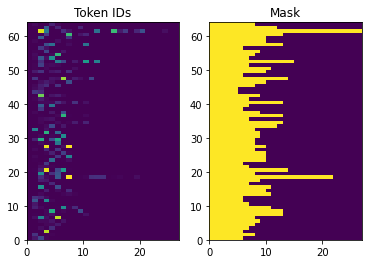

In [ ]:
plt.subplot(1, 2, 1)
plt.pcolormesh(example_tokens)
plt.title('Token IDs')

plt.subplot(1, 2, 2)
plt.pcolormesh(example_tokens != 0)
plt.title('Mask')

El modelo de codificador / decodificador

El siguiente diagrama muestra una descripción general del modelo. En cada paso de tiempo, la salida del decodificador se combina con una suma ponderada sobre la entrada codificada, para predecir la siguiente palabra. El diagrama y fórmulas son de papel de Luong .

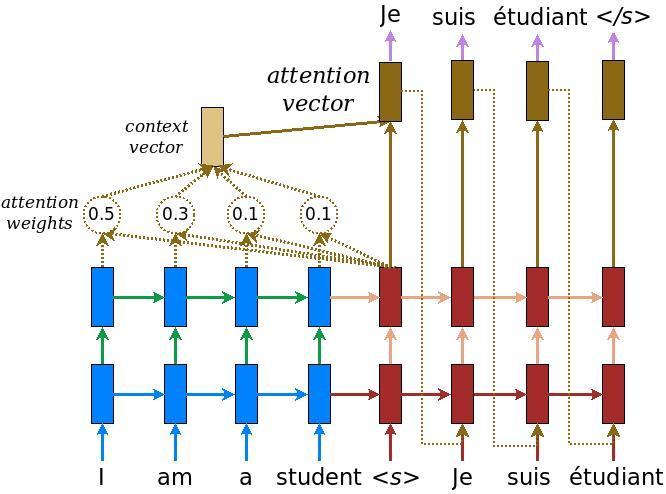

**El codificador**


Empiece por construir el codificador, la parte azul del diagrama de arriba.

El codificador:

1. Toma una lista de ID de testigo (de input_text_processor ).
2. Mira hacia arriba un vector de inclusión para cada ficha (El uso de un layers.Embedding ).
3. Procesa las incrustaciones en una nueva secuencia (utilizando un layers.GRU ).
4. Devoluciones:


*   La secuencia procesada. Esto se pasará al jefede atención.
*   
El estado interno. Esto se utilizará para inicializar el decodificador.



In [ ]:
embedding_dim = 256
units = 256

In [ ]:
class ShapeChecker:
  def __init__(self):
    self.shapes = []

  def __call__(self, tensor, names=None):
    if names is None:
      names = []
    if not isinstance(names, (list, tuple)):
      names = [names]
    name = '.'.join(names)
    self.shapes.append((name, tf.shape(tensor)))
    return self

  def __str__(self):
    return ', '.join(
        '{}: {}'.format(name, shape.as_list())
        for name, shape in self.shapes
    )


In [ ]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, input_vocab_size, embedding_dim, enc_units):
        super(Encoder, self).__init__()

        # Establecer las propiedades de la capa de codificación
        self.enc_units = enc_units
        self.input_vocab_size = input_vocab_size

        # Definir la capa de incrustación
        # Convierte tokens en vectores de longitud fija
        self.embedding = tf.keras.layers.Embedding(self.input_vocab_size,
                                                   embedding_dim)

        # Definir la capa GRU
        # Procesa los vectores de entrada secuencialmente
        self.gru = tf.keras.layers.GRU(self.enc_units,
                                       # Devolver la secuencia y el estado
                                       return_sequences=True,
                                       return_state=True,
                                       # Inicializar los pesos de forma uniforme
                                       recurrent_initializer='glorot_uniform')

    def call(self, tokens, state=None):
        # Comprobar la forma de entrada
        shape_checker = ShapeChecker()
        shape_checker(tokens, ('batch', 's'))

        # Aplicar la capa de incrustación a la entrada
        vectors = self.embedding(tokens)
        # Comprobar la forma de la salida
        shape_checker(vectors, ('batch', 's', 'embed_dim'))

        # Aplicar la capa GRU a la secuencia de incrustaciones
        output, state = self.gru(vectors, initial_state=state)
        # Comprobar la forma de la salida y el estado
        shape_checker(output, ('batch', 's', 'enc_units'))
        shape_checker(state, ('batch', 'enc_units'))

        # Devolver la secuencia de salida y el estado final
        return output, state


En el método __init__:

input_vocab_size es el tamaño del vocabulario de entrada.
embedding_dim es la dimensión de la incrustación.
enc_units es la cantidad de unidades en la capa GRU.
super(Encoder, self).__init__() llama al constructor de la superclase.
En la definición de la capa de incrustación:

tf.keras.layers.Embedding crea una capa de incrustación que convierte los tokens de entrada en vectores de longitud fija. El tamaño del vocabulario y la dimensión de la incrustación se especifican en la inicialización de la clase.
En la definición de la capa GRU:

tf.keras.layers.GRU crea una capa GRU que procesa los vectores de entrada secuencialmente. La cantidad de unidades en la capa GRU se especifica en la inicialización de la clase.
return_sequences=True indica que la capa GRU debe devolver la secuencia de salida completa en lugar de solo el último estado oculto.
return_state=True indica que la capa GRU debe devolver el último estado oculto en lugar de solo la secuencia de salida.
recurrent_initializer='glorot_uniform' inicializa los pesos de la capa GRU de forma uniforme.
En el método call:

ShapeChecker es una clase auxiliar que se utiliza para comprobar la forma de los tensores en diferentes etapas del proceso. Se crea una instancia de esta clase en el método call.
tokens es la entrada a la capa de codificación.

vectors es la secuencia de incrustaciones resultante de aplicar la capa de incrustación a la entrada tokens.
self.gru es una capa GRU que procesa la secuencia de incrustaciones vectors. La salida output es la secuencia de salida completa de la capa GRU, y state es el último estado oculto.
El método shape_checker comprueba la forma de la salida vectors y la salida output y el estado state de la capa GRU.
Finalmente, el método devuelve la secuencia de salida output y el último estado oculto state.

resultados hasta ahora:

In [ ]:
# Convertir el texto de entrada en tokens.
example_tokens = input_text_processor(example_input_batch)

# Codificar la secuencia de entrada.
encoder = Encoder(input_text_processor.vocabulary_size(),
                  embedding_dim, units)
example_enc_output, example_enc_state = encoder(example_tokens)

# Imprimir la forma del lote de entrada, los tokens de entrada del lote, la salida del codificador y el estado del codificador.
print(f'Lote de entrada, forma (lote): {example_input_batch.shape}')
print(f'Tokens de entrada del lote, forma (lote, s): {example_tokens.shape}')
print(f'Salida del codificador, forma (lote, s, unidades): {example_enc_output.shape}')
print(f'Estado del codificador, forma (lote, unidades): {example_enc_state.shape}')


Lote de entrada, forma (lote): (64,)
Tokens de entrada del lote, forma (lote, s): (64, 27)
Salida del codificador, forma (lote, s, unidades): (64, 27, 256)
Estado del codificador, forma (lote, unidades): (64, 256)


"El codificador devuelve su estado interno para que pueda ser utilizado para inicializar el decodificador. También es común que un RNN devuelva su estado para poder procesar una secuencia en varias llamadas. Verás más sobre esto al construir el decodificador.

La capa de atención:
El decodificador utiliza la atención para enfocarse selectivamente en partes de la secuencia de entrada. La atención toma una secuencia de vectores como entrada para cada ejemplo y devuelve un vector de "atención" para cada ejemplo. Esta capa de atención es similar a una capa de GlobalAveragePooling1D, pero en lugar de realizar un promedio simple, realiza un promedio ponderado.

Veamos cómo funciona esto:

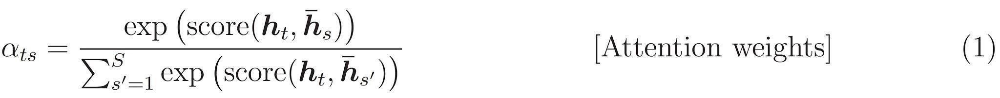

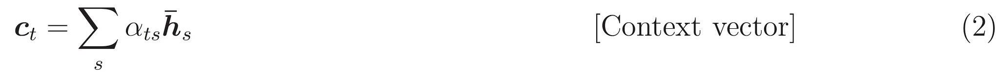

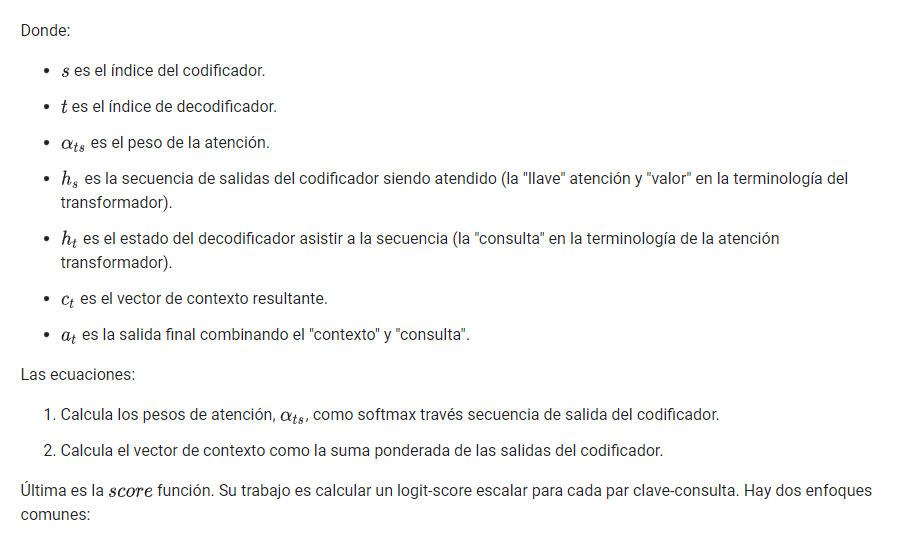

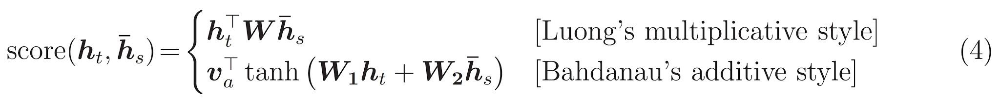

Este tutorial usa la atención aditivo de Bahdanau . TensorFlow incluye implementaciones de tanto como layers.Attention y layers.AdditiveAttention . La clase por debajo de las manijas de las matrices de peso en un par de layers.Dense capas, y llama a la implementación incorporada.

In [ ]:
class BahdanauAttention(tf.keras.layers.Layer):
  def __init__(self, units):
    super().__init__()
    # For Eqn. (4), the  Bahdanau attention
    self.W1 = tf.keras.layers.Dense(units, use_bias=False)
    self.W2 = tf.keras.layers.Dense(units, use_bias=False)

    self.attention = tf.keras.layers.AdditiveAttention()

  def call(self, query, value, mask):
    shape_checker = ShapeChecker()
    shape_checker(query, ('batch', 't', 'query_units'))
    shape_checker(value, ('batch', 's', 'value_units'))
    shape_checker(mask, ('batch', 's'))

    # From Eqn. (4), `W1@ht`.
    w1_query = self.W1(query)
    shape_checker(w1_query, ('batch', 't', 'attn_units'))

    # From Eqn. (4), `W2@hs`.
    w2_key = self.W2(value)
    shape_checker(w2_key, ('batch', 's', 'attn_units'))

    query_mask = tf.ones(tf.shape(query)[:-1], dtype=bool)
    value_mask = mask

    context_vector, attention_weights = self.attention(
        inputs = [w1_query, value, w2_key],
        mask=[query_mask, value_mask],
        return_attention_scores = True,
    )
    shape_checker(context_vector, ('batch', 't', 'value_units'))
    shape_checker(attention_weights, ('batch', 't', 's'))

    return context_vector, attention_weights

Prueba la capa de atención
Crear un BahdanauAttention capa:

In [ ]:
attention_layer = BahdanauAttention(units)

Esta capa toma 3 entradas:

- La query : Este será generada por el decodificador, más adelante.
- El value : Esta será la salida del codificador.
- La mask : para excluir el relleno, example_tokens != 0

In [ ]:
(example_tokens != 0).shape

TensorShape([64, 27])

La implementación vectorizada de la capa de atención le permite pasar un lote de secuencias de vectores de consulta y un lote de secuencia de vectores de valor. El resultado es:

Un lote de secuencias de vectores de resultado del tamaño de las consultas.
A la atención de lote mapas, con tamaño (query_length, value_length) .

In [ ]:
# Later, the decoder will generate this attention query
example_attention_query = tf.random.normal(shape=[len(example_tokens), 2, 10])

# Attend to the encoded tokens

context_vector, attention_weights = attention_layer(
    query=example_attention_query,
    value=example_enc_output,
    mask=(example_tokens != 0))

print(f'Attention result shape: (batch_size, query_seq_length, units):           {context_vector.shape}')
print(f'Attention weights shape: (batch_size, query_seq_length, value_seq_length): {attention_weights.shape}')

Attention result shape: (batch_size, query_seq_length, units):           (64, 2, 256)
Attention weights shape: (batch_size, query_seq_length, value_seq_length): (64, 2, 27)


Los pesos de atención deben sumar a 1.0 para cada secuencia.

Aquí son los pesos de atención a través de las secuencias en t=0 :

Text(0.5, 1.0, 'Mask')

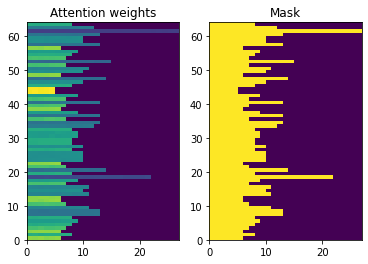

In [ ]:
plt.subplot(1, 2, 1)
plt.pcolormesh(attention_weights[:, 0, :])
plt.title('Attention weights')

plt.subplot(1, 2, 2)
plt.pcolormesh(example_tokens != 0)
plt.title('Mask')

Debido a la inicialización de pequeña azar los pesos de atención son todos cerca de 1/(sequence_length) . Si se acerca a los pesos para una sola secuencia, se puede ver que hay una pequeña variación que el modelo puede aprender a ampliar y explotar.

In [ ]:
attention_weights.shape

TensorShape([64, 2, 27])

In [ ]:
attention_slice = attention_weights[0, 0].numpy()
attention_slice = attention_slice[attention_slice != 0]

<Figure size 432x288 with 0 Axes>

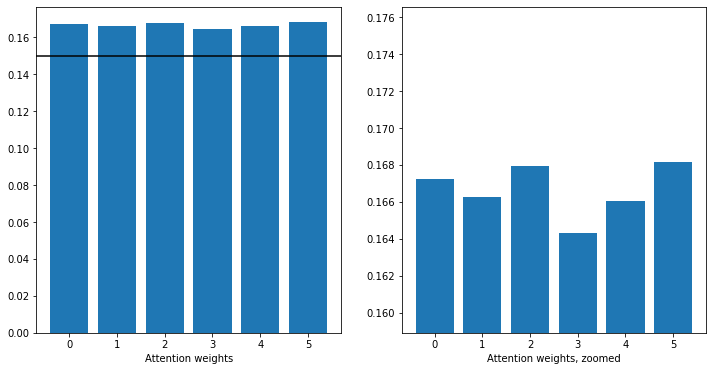

In [ ]:
 plt.suptitle('Attention weights for one sequence')

plt.figure(figsize=(12, 6))
a1 = plt.subplot(1, 2, 1)
plt.bar(range(len(attention_slice)), attention_slice)
# freeze the xlim
plt.xlim(plt.xlim())
plt.xlabel('Attention weights')

a2 = plt.subplot(1, 2, 2)
plt.bar(range(len(attention_slice)), attention_slice)
plt.xlabel('Attention weights, zoomed')

# zoom in
top = max(a1.get_ylim())
zoom = 0.85*top
a2.set_ylim([0.90*top, top])
a1.plot(a1.get_xlim(), [zoom, zoom], color='k')

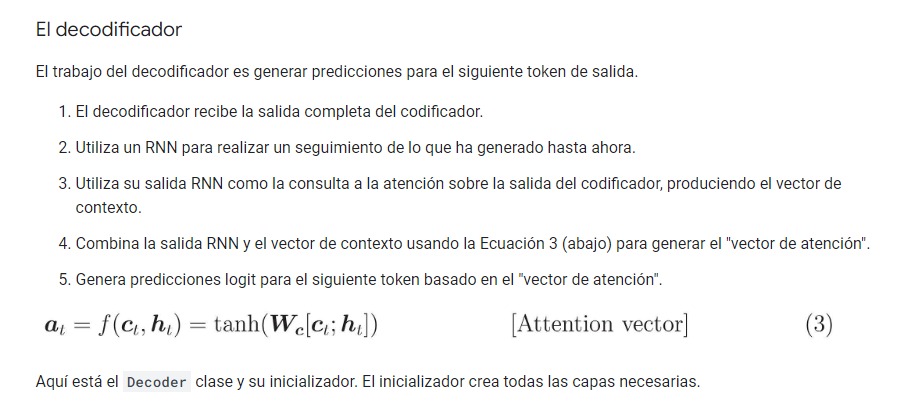

In [ ]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, output_vocab_size, embedding_dim, dec_units):
    super(Decoder, self).__init__()
    self.dec_units = dec_units
    self.output_vocab_size = output_vocab_size
    self.embedding_dim = embedding_dim

    # For Step 1. The embedding layer convets token IDs to vectors
    self.embedding = tf.keras.layers.Embedding(self.output_vocab_size,
                                               embedding_dim)

    # For Step 2. The RNN keeps track of what's been generated so far.
    self.gru = tf.keras.layers.GRU(self.dec_units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')

    # For step 3. The RNN output will be the query for the attention layer.
    self.attention = BahdanauAttention(self.dec_units)

    # For step 4. Eqn. (3): converting `ct` to `at`
    self.Wc = tf.keras.layers.Dense(dec_units, activation=tf.math.tanh,
                                    use_bias=False)

    # For step 5. This fully connected layer produces the logits for each
    # output token.
    self.fc = tf.keras.layers.Dense(self.output_vocab_size)

La call método para esta capa toma y devuelve varios tensores. Organícelos en clases de contenedores simples:

In [ ]:
class DecoderInput(typing.NamedTuple):
  new_tokens: Any
  enc_output: Any
  mask: Any

class DecoderOutput(typing.NamedTuple):
  logits: Any
  attention_weights: Any

Aquí está la aplicación de la call método:

In [ ]:
def call(self,
         inputs: DecoderInput,
         state=None) -> Tuple[DecoderOutput, tf.Tensor]:
  shape_checker = ShapeChecker()
  shape_checker(inputs.new_tokens, ('batch', 't'))
  shape_checker(inputs.enc_output, ('batch', 's', 'enc_units'))
  shape_checker(inputs.mask, ('batch', 's'))

  if state is not None:
    shape_checker(state, ('batch', 'dec_units'))

  # Step 1. Lookup the embeddings
  vectors = self.embedding(inputs.new_tokens)
  shape_checker(vectors, ('batch', 't', 'embedding_dim'))

  # Step 2. Process one step with the RNN
  rnn_output, state = self.gru(vectors, initial_state=state)

  shape_checker(rnn_output, ('batch', 't', 'dec_units'))
  shape_checker(state, ('batch', 'dec_units'))

  # Step 3. Use the RNN output as the query for the attention over the
  # encoder output.
  context_vector, attention_weights = self.attention(
      query=rnn_output, value=inputs.enc_output, mask=inputs.mask)
  shape_checker(context_vector, ('batch', 't', 'dec_units'))
  shape_checker(attention_weights, ('batch', 't', 's'))

  # Step 4. Eqn. (3): Join the context_vector and rnn_output
  #     [ct; ht] shape: (batch t, value_units + query_units)
  context_and_rnn_output = tf.concat([context_vector, rnn_output], axis=-1)

  # Step 4. Eqn. (3): `at = tanh(Wc@[ct; ht])`
  attention_vector = self.Wc(context_and_rnn_output)
  shape_checker(attention_vector, ('batch', 't', 'dec_units'))

  # Step 5. Generate logit predictions:
  logits = self.fc(attention_vector)
  shape_checker(logits, ('batch', 't', 'output_vocab_size'))

  return DecoderOutput(logits, attention_weights), state

In [ ]:
Decoder.call = call

El codificador procesa su secuencia de entrada completa con una sola llamada a su RNN. Esta implementación del decodificador puede hacer eso también a un entrenamiento eficiente. Pero este tutorial ejecutará el decodificador en un bucle por algunas razones:

- Flexibilidad: escribir el bucle le da control directo sobre el procedimiento de entrenamiento.
- Claridad: Es posible hacer trucos de enmascaramiento y utilizar layers.RNN o tfa.seq2seq API para empacar todo esto en una sola llamada. Pero escribirlo como un bucle puede ser más claro.
- Bucle de capacitación gratuita se demuestra en la generación de texto tutiorial.
Ahora intente usar este decodificador.

In [ ]:
decoder = Decoder(output_text_processor.vocabulary_size(),
                  embedding_dim, units)

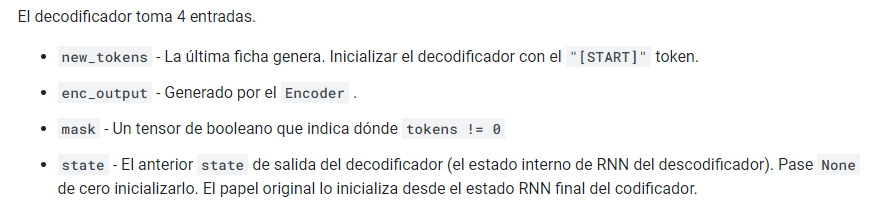

In [ ]:
# Convert the target sequence, and collect the "[START]" tokens
example_output_tokens = output_text_processor(example_target_batch)

start_index = output_text_processor.get_vocabulary().index('[START]')
first_token = tf.constant([[start_index]] * example_output_tokens.shape[0])

In [ ]:
# Run the decoder
dec_result, dec_state = decoder(
    inputs = DecoderInput(new_tokens=first_token,
                          enc_output=example_enc_output,
                          mask=(example_tokens != 0)),
    state = example_enc_state
)

print(f'logits shape: (batch_size, t, output_vocab_size) {dec_result.logits.shape}')
print(f'state shape: (batch_size, dec_units) {dec_state.shape}')

logits shape: (batch_size, t, output_vocab_size) (64, 1, 5000)
state shape: (batch_size, dec_units) (64, 256)


Muestra un token de acuerdo con los logits:

In [ ]:
sampled_token = tf.random.categorical(dec_result.logits[:, 0, :], num_samples=1)

Decodifica el token como la primera palabra de la salida:

In [ ]:
vocab = np.array(output_text_processor.get_vocabulary())
first_word = vocab[sampled_token.numpy()]
first_word[:5]

array([['cough'],
       ['blood'],
       ['bumped'],
       ['uncomfortable'],
       ['resemblance']], dtype='<U16')

Ahora use el decodificador para generar un segundo conjunto de logits.

- Pase al mismo enc_output y mask , éstos no han cambiado.
- Pasar el muestreado token como new_tokens .
- Pasar el decoder_state el decodificador regresó por última vez, por lo que el RNN continúa con un recuerdo de donde lo dejó la última vez.

In [ ]:
dec_result, dec_state = decoder(
    DecoderInput(sampled_token,
                 example_enc_output,
                 mask=(example_tokens != 0)),
    state=dec_state)

In [ ]:
sampled_token = tf.random.categorical(dec_result.logits[:, 0, :], num_samples=1)
first_word = vocab[sampled_token.numpy()]
first_word[:5]

array([['suitable'],
       ['smiled'],
       ['assembled'],
       ['closet'],
       ['unfortunate']], dtype='<U16')

###ENTRENAMIENTO DEL MODELO

Ahora que tiene todos los componentes del modelo, es hora de comenzar a entrenar el modelo. Necesitarás:

Una función de pérdida y un optimizador para realizar la optimización.
Una función de paso de entrenamiento que define cómo actualizar el modelo para cada lote de entrada / destino.
Un circuito de entrenamiento para impulsar el entrenamiento y guardar puntos de control.
- Definir la función de pérdida

In [ ]:
class MaskedLoss(tf.keras.losses.Loss):
  def __init__(self):
    self.name = 'masked_loss'
    self.loss = tf.keras.losses.SparseCategoricalCrossentropy(
        from_logits=True, reduction='none')

  def __call__(self, y_true, y_pred):
    shape_checker = ShapeChecker()
    shape_checker(y_true, ('batch', 't'))
    shape_checker(y_pred, ('batch', 't', 'logits'))

    # Calculate the loss for each item in the batch.
    loss = self.loss(y_true, y_pred)
    shape_checker(loss, ('batch', 't'))

    # Mask off the losses on padding.
    mask = tf.cast(y_true != 0, tf.float32)
    shape_checker(mask, ('batch', 't'))
    loss *= mask

    # Return the total.
    return tf.reduce_sum(loss)

Implementar el paso de formación
- Comienza con una clase del modelo, el proceso de formación se llevará a cabo como el train_step método en este modelo. Véase Personalización de ajuste para más detalles.

- Aquí el train_step método es una envoltura alrededor de la _train_step aplicación que vendrá después. Este envoltorio incluye un interruptor para encender y apagar tf.function compilación, para hacer más fácil la depuración.

In [ ]:
class TrainTranslator(tf.keras.Model):
  def __init__(self, embedding_dim, units,
               input_text_processor,
               output_text_processor,
               use_tf_function=True):
    super().__init__()
    # Build the encoder and decoder
    encoder = Encoder(input_text_processor.vocabulary_size(),
                      embedding_dim, units)
    decoder = Decoder(output_text_processor.vocabulary_size(),
                      embedding_dim, units)

    self.encoder = encoder
    self.decoder = decoder
    self.input_text_processor = input_text_processor
    self.output_text_processor = output_text_processor
    self.use_tf_function = use_tf_function
    self.shape_checker = ShapeChecker()

  def train_step(self, inputs):
    self.shape_checker = ShapeChecker()
    if self.use_tf_function:
      return self._tf_train_step(inputs)
    else:
      return self._train_step(inputs)

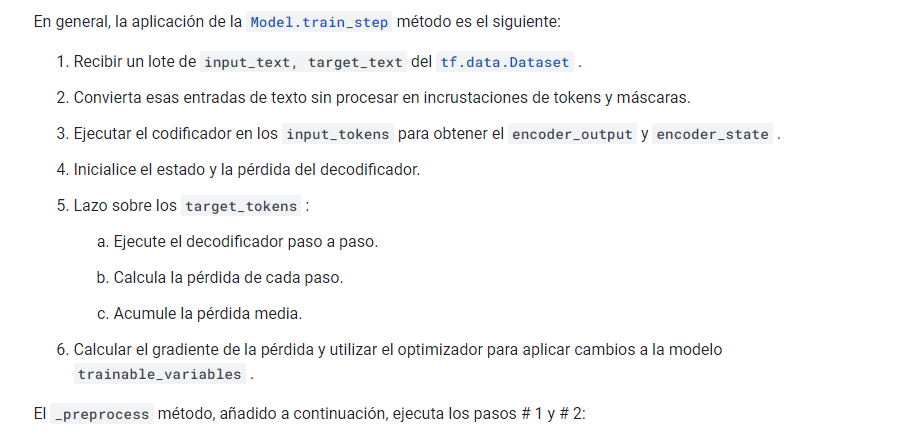

In [ ]:
def _preprocess(self, input_text, target_text):
  self.shape_checker(input_text, ('batch',))
  self.shape_checker(target_text, ('batch',))

  # Convert the text to token IDs
  input_tokens = self.input_text_processor(input_text)
  target_tokens = self.output_text_processor(target_text)
  self.shape_checker(input_tokens, ('batch', 's'))
  self.shape_checker(target_tokens, ('batch', 't'))

  # Convert IDs to masks.
  input_mask = input_tokens != 0
  self.shape_checker(input_mask, ('batch', 's'))

  target_mask = target_tokens != 0
  self.shape_checker(target_mask, ('batch', 't'))

  return input_tokens, input_mask, target_tokens, target_mask

In [ ]:
TrainTranslator._preprocess = _preprocess

El _train_step método, añadido a continuación, se ocupa de los pasos restantes, excepto para ejecutar realmente el decodificador:

In [ ]:
def _train_step(self, inputs):
  input_text, target_text = inputs

  (input_tokens, input_mask,
   target_tokens, target_mask) = self._preprocess(input_text, target_text)

  max_target_length = tf.shape(target_tokens)[1]

  with tf.GradientTape() as tape:
    # Encode the input
    enc_output, enc_state = self.encoder(input_tokens)
    self.shape_checker(enc_output, ('batch', 's', 'enc_units'))
    self.shape_checker(enc_state, ('batch', 'enc_units'))

    # Initialize the decoder's state to the encoder's final state.
    # This only works if the encoder and decoder have the same number of
    # units.
    dec_state = enc_state
    loss = tf.constant(0.0)

    for t in tf.range(max_target_length-1):
      # Pass in two tokens from the target sequence:
      # 1. The current input to the decoder.
      # 2. The target for the decoder's next prediction.
      new_tokens = target_tokens[:, t:t+2]
      step_loss, dec_state = self._loop_step(new_tokens, input_mask,
                                             enc_output, dec_state)
      loss = loss + step_loss

    # Average the loss over all non padding tokens.
    average_loss = loss / tf.reduce_sum(tf.cast(target_mask, tf.float32))

  # Apply an optimization step
  variables = self.trainable_variables
  gradients = tape.gradient(average_loss, variables)
  self.optimizer.apply_gradients(zip(gradients, variables))

  # Return a dict mapping metric names to current value
  return {'batch_loss': average_loss}

In [ ]:
TrainTranslator._train_step = _train_step

El _loop_step método, añadido a continuación, ejecuta el decodificador y calcula la pérdida gradual y nuevo estado del decodificador ( dec_state ).

In [ ]:
def _loop_step(self, new_tokens, input_mask, enc_output, dec_state):
  input_token, target_token = new_tokens[:, 0:1], new_tokens[:, 1:2]

  # Run the decoder one step.
  decoder_input = DecoderInput(new_tokens=input_token,
                               enc_output=enc_output,
                               mask=input_mask)

  dec_result, dec_state = self.decoder(decoder_input, state=dec_state)
  self.shape_checker(dec_result.logits, ('batch', 't1', 'logits'))
  self.shape_checker(dec_result.attention_weights, ('batch', 't1', 's'))
  self.shape_checker(dec_state, ('batch', 'dec_units'))

  # `self.loss` returns the total for non-padded tokens
  y = target_token
  y_pred = dec_result.logits
  step_loss = self.loss(y, y_pred)

  return step_loss, dec_state

In [ ]:
TrainTranslator._loop_step = _loop_step

Prueba el paso de entrenamiento
- Construir un TrainTranslator , y configurarlo para entrenar con el Model.compile método:

In [ ]:
translator = TrainTranslator(
    embedding_dim, units,
    input_text_processor=input_text_processor,
    output_text_processor=output_text_processor,
    use_tf_function=False)

# Configure the loss and optimizer
translator.compile(
    optimizer=tf.optimizers.Adam(),
    loss=MaskedLoss(),
)

Probar el train_step . Para un modelo de texto como este, la pérdida debería comenzar cerca de:

In [ ]:
np.log(output_text_processor.vocabulary_size())

8.517193191416238

In [ ]:
%%time
for n in range(10):
  print(translator.train_step([example_input_batch, example_target_batch]))
print()

{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.631067>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.62219>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.611845>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.5974426>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.5755033>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.5407844>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.4848237>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.3933372>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=7.2411976>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=6.983272>}

CPU times: user 33.4 s, sys: 2.02 s, total: 35.4 s
Wall time: 28.4 s


Si bien es más fácil de depurar sin tf.function sí da un aumento de rendimiento. Así que ahora que el _train_step método funciona, pruebe el tf.function -wrapped _tf_train_step , para maximizar el rendimiento durante el entrenamiento:

In [ ]:
@tf.function(input_signature=[[tf.TensorSpec(dtype=tf.string, shape=[None]),
                               tf.TensorSpec(dtype=tf.string, shape=[None])]])
def _tf_train_step(self, inputs):
  return self._train_step(inputs)

In [ ]:
TrainTranslator._tf_train_step = _tf_train_step

In [ ]:
translator.use_tf_function = True

La primera llamada será lenta porque rastrea la función.

In [ ]:
translator.train_step([example_input_batch, example_target_batch])

{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=6.5438046>}

Pero después de que por lo general es 2-3 veces más rápido que el ansioso train_step método:

In [ ]:
%%time
for n in range(10):
  print(translator.train_step([example_input_batch, example_target_batch]))
print()

{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=5.8647766>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=5.189016>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.834531>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.6422606>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.5009775>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.389277>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.3021536>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.2374516>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.192528>}
{'batch_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.1622205>}

CPU times: user 20 s, sys: 555 ms, total: 20.5 s
Wall time: 20.5 s


Una buena prueba de un nuevo modelo es ver que puede adaptarse a un solo lote de entrada. Pruébelo, la pérdida debería ir rápidamente a cero:

....................................................................................................


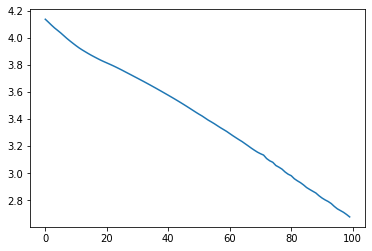

In [ ]:
losses = []
for n in range(100):
  print('.', end='')
  logs = translator.train_step([example_input_batch, example_target_batch])
  losses.append(logs['batch_loss'].numpy())

print()
plt.plot(losses)

Ahora que está seguro de que el paso de entrenamiento está funcionando, cree una copia nueva del modelo para entrenar desde cero:

In [ ]:
train_translator = TrainTranslator(
    embedding_dim, units,
    input_text_processor=input_text_processor,
    output_text_processor=output_text_processor)

# Configure the loss and optimizer
train_translator.compile(
    optimizer=tf.optimizers.Adam(),
    loss=MaskedLoss(),
)

Entrena el modelo

Aunque no hay nada malo en escribir su propio bucle de entrenamiento personalizado, aplicar el método Model.train_step, al igual que se hizo en la sección anterior, le permite ejecutar Model.fit y no tener que escribir todo ese código manualmente.

Este tutorial entrena solo durante un par de épocas. Por lo tanto, se utiliza un callbacks.Callback para recopilar el historial de pérdidas por lotes para trazarlo

In [ ]:
class BatchLogs(tf.keras.callbacks.Callback):
  def __init__(self, key):
    self.key = key
    self.logs = []

  def on_train_batch_end(self, n, logs):
    self.logs.append(logs[self.key])

batch_loss = BatchLogs('batch_loss')

In [ ]:
train_translator.fit(dataset, epochs=3,
                     callbacks=[batch_loss])

Epoch 1/3
1859/1859 [==============================] - 2130s 1s/step - batch_loss: 3.3214
Epoch 2/3
1859/1859 [==============================] - 1935s 1s/step - batch_loss: 1.5609
Epoch 3/3
1859/1859 [==============================] - 1935s 1s/step - batch_loss: 1.1288


Text(0, 0.5, 'CE/token')

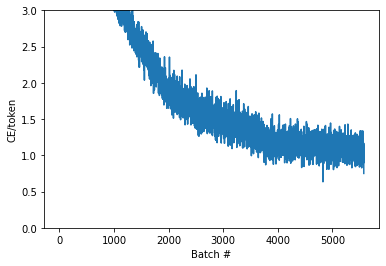

In [ ]:
plt.plot(batch_loss.logs)
plt.ylim([0, 3])
plt.xlabel('Batch #')
plt.ylabel('CE/token')

##TRADUCIR

Ahora que el modelo está entrenado, se implementará una función para ejecutar la traducción completa de texto => texto.

Para este modelo, es necesario invertir la asignación de text => token IDs proporcionada por output_text_processor. También es necesario conocer los IDs de los tokens especiales. Todo esto está implementado en el constructor de la nueva clase. A continuación, se mostrará la implementación del método de traducción real.

En general, esto es similar al ciclo de entrenamiento, excepto que la entrada al decodificador en cada paso de tiempo es una muestra de la última predicción del decodificador

In [ ]:
class Translator(tf.Module):

  def __init__(self, encoder, decoder, input_text_processor,
               output_text_processor):
    self.encoder = encoder
    self.decoder = decoder
    self.input_text_processor = input_text_processor
    self.output_text_processor = output_text_processor

    self.output_token_string_from_index = (
        tf.keras.layers.StringLookup(
            vocabulary=output_text_processor.get_vocabulary(),
            mask_token='',
            invert=True))

    # The output should never generate padding, unknown, or start.
    index_from_string = tf.keras.layers.StringLookup(
        vocabulary=output_text_processor.get_vocabulary(), mask_token='')
    token_mask_ids = index_from_string(['', '[UNK]', '[START]']).numpy()

    token_mask = np.zeros([index_from_string.vocabulary_size()], dtype=bool)
    token_mask[np.array(token_mask_ids)] = True
    self.token_mask = token_mask

    self.start_token = index_from_string(tf.constant('[START]'))
    self.end_token = index_from_string(tf.constant('[END]'))

In [ ]:
translator = Translator(
    encoder=train_translator.encoder,
    decoder=train_translator.decoder,
    input_text_processor=input_text_processor,
    output_text_processor=output_text_processor,
)

Convertir ID de token en texto

El primer método que se aplicará es tokens_to_text, que convierte de ID de tokens a texto legible por humanos.

In [ ]:
def tokens_to_text(self, result_tokens):
  shape_checker = ShapeChecker()
  shape_checker(result_tokens, ('batch', 't'))
  result_text_tokens = self.output_token_string_from_index(result_tokens)
  shape_checker(result_text_tokens, ('batch', 't'))

  result_text = tf.strings.reduce_join(result_text_tokens,
                                       axis=1, separator=' ')
  shape_checker(result_text, ('batch'))

  result_text = tf.strings.strip(result_text)
  shape_checker(result_text, ('batch',))
  return result_text

In [ ]:
Translator.tokens_to_text = tokens_to_text

Ingrese algunos ID de token aleatorios y vea lo que genera:

In [ ]:
example_output_tokens = tf.random.uniform(
    shape=[5, 2], minval=0, dtype=tf.int64,
    maxval=output_text_processor.vocabulary_size())
translator.tokens_to_text(example_output_tokens).numpy()

array([b'aboard better', b'tires enemies', b'puts granted',
       b'house recovery', b'seconds washington'], dtype=object)

Muestra de las predicciones del decodificador

Esta función toma las salidas logit del decodificador y muestra los ID de token de esa distribución:

In [ ]:
def sample(self, logits, temperature):
  shape_checker = ShapeChecker()
  # 't' is usually 1 here.
  shape_checker(logits, ('batch', 't', 'vocab'))
  shape_checker(self.token_mask, ('vocab',))

  token_mask = self.token_mask[tf.newaxis, tf.newaxis, :]
  shape_checker(token_mask, ('batch', 't', 'vocab'))

  # Set the logits for all masked tokens to -inf, so they are never chosen.
  logits = tf.where(self.token_mask, -np.inf, logits)

  if temperature == 0.0:
    new_tokens = tf.argmax(logits, axis=-1)
  else:
    logits = tf.squeeze(logits, axis=1)
    new_tokens = tf.random.categorical(logits/temperature,
                                        num_samples=1)

  shape_checker(new_tokens, ('batch', 't'))

  return new_tokens

In [ ]:
Translator.sample = sample

Pruebe la ejecución de esta función en algunas entradas aleatorias:

In [ ]:
example_logits = tf.random.normal([5, 1, output_text_processor.vocabulary_size()])
example_output_tokens = translator.sample(example_logits, temperature=1.0)
example_output_tokens

<tf.Tensor: shape=(5, 1), dtype=int64, numpy=
array([[2472],
       [ 789],
       [ 684],
       [ 404],
       [4196]])>

Implementar el ciclo de traducción

A continuación, se muestra una implementación completa del ciclo de traducción de texto a texto.

Esta aplicación recopila los resultados en listas de Python antes de unirlos en tensores con tf.concat.

Esta aplicación desenrolla estáticamente el gráfico en max_length iteraciones. Esto está bien con una ejecución ansiosa en Python

In [ ]:
def translate_unrolled(self,
                       input_text, *,
                       max_length=50,
                       return_attention=True,
                       temperature=1.0):
  batch_size = tf.shape(input_text)[0]
  input_tokens = self.input_text_processor(input_text)
  enc_output, enc_state = self.encoder(input_tokens)

  dec_state = enc_state
  new_tokens = tf.fill([batch_size, 1], self.start_token)

  result_tokens = []
  attention = []
  done = tf.zeros([batch_size, 1], dtype=tf.bool)

  for _ in range(max_length):
    dec_input = DecoderInput(new_tokens=new_tokens,
                             enc_output=enc_output,
                             mask=(input_tokens!=0))

    dec_result, dec_state = self.decoder(dec_input, state=dec_state)

    attention.append(dec_result.attention_weights)

    new_tokens = self.sample(dec_result.logits, temperature)

    # If a sequence produces an `end_token`, set it `done`
    done = done | (new_tokens == self.end_token)
    # Once a sequence is done it only produces 0-padding.
    new_tokens = tf.where(done, tf.constant(0, dtype=tf.int64), new_tokens)

    # Collect the generated tokens
    result_tokens.append(new_tokens)

    if tf.executing_eagerly() and tf.reduce_all(done):
      break

  # Convert the list of generates token ids to a list of strings.
  result_tokens = tf.concat(result_tokens, axis=-1)
  result_text = self.tokens_to_text(result_tokens)

  if return_attention:
    attention_stack = tf.concat(attention, axis=1)
    return {'text': result_text, 'attention': attention_stack}
  else:
    return {'text': result_text}

In [ ]:
Translator.translate = translate_unrolled

Ejecútelo con una entrada simple:

In [ ]:
%%time
input_text = tf.constant([
    'hace mucho frio aqui.', # "It's really cold here."
    'Esta es mi vida.', # "This is my life.""
])

result = translator.translate(
    input_text = input_text)

print(result['text'][0].numpy().decode())
print(result['text'][1].numpy().decode())
print()

this is very cold here .
this is my life .

CPU times: user 253 ms, sys: 6.89 ms, total: 260 ms
Wall time: 443 ms


Si desea exportar este modelo que necesita para envolver este método en una tf.function . Esta implementación básica tiene algunos problemas si intenta hacer eso:

- Los gráficos resultantes son muy grandes y tardan unos segundos en crearse, guardar o cargar.
- No se puede romper con un bucle desenrollado de forma estática, por lo que siempre se ejecutará max_length iteraciones, incluso si se realizan todas las salidas. Pero incluso entonces es un poco más rápido que una ejecución ansiosa.

In [ ]:
@tf.function(input_signature=[tf.TensorSpec(dtype=tf.string, shape=[None])])
def tf_translate(self, input_text):
  return self.translate(input_text)

Translator.tf_translate = tf_translate

Ejecutar el tf.function vez para compilarlo:

In [ ]:
%%time
result = translator.tf_translate(
    input_text = input_text)

In [ ]:
%%time
result = translator.tf_translate(
    input_text = input_text)

print(result['text'][0].numpy().decode())
print(result['text'][1].numpy().decode())
print()

[Opcional] Utilice un bucle simbólico

In [ ]:
def translate_symbolic(self,
                       input_text,
                       *,
                       max_length=50,
                       return_attention=True,
                       temperature=1.0):
  shape_checker = ShapeChecker()
  shape_checker(input_text, ('batch',))

  batch_size = tf.shape(input_text)[0]

  # Encode the input
  input_tokens = self.input_text_processor(input_text)
  shape_checker(input_tokens, ('batch', 's'))

  enc_output, enc_state = self.encoder(input_tokens)
  shape_checker(enc_output, ('batch', 's', 'enc_units'))
  shape_checker(enc_state, ('batch', 'enc_units'))

  # Initialize the decoder
  dec_state = enc_state
  new_tokens = tf.fill([batch_size, 1], self.start_token)
  shape_checker(new_tokens, ('batch', 't1'))

  # Initialize the accumulators
  result_tokens = tf.TensorArray(tf.int64, size=1, dynamic_size=True)
  attention = tf.TensorArray(tf.float32, size=1, dynamic_size=True)
  done = tf.zeros([batch_size, 1], dtype=tf.bool)
  shape_checker(done, ('batch', 't1'))

  for t in tf.range(max_length):
    dec_input = DecoderInput(
        new_tokens=new_tokens, enc_output=enc_output, mask=(input_tokens != 0))

    dec_result, dec_state = self.decoder(dec_input, state=dec_state)

    shape_checker(dec_result.attention_weights, ('batch', 't1', 's'))
    attention = attention.write(t, dec_result.attention_weights)

    new_tokens = self.sample(dec_result.logits, temperature)
    shape_checker(dec_result.logits, ('batch', 't1', 'vocab'))
    shape_checker(new_tokens, ('batch', 't1'))

    # If a sequence produces an `end_token`, set it `done`
    done = done | (new_tokens == self.end_token)
    # Once a sequence is done it only produces 0-padding.
    new_tokens = tf.where(done, tf.constant(0, dtype=tf.int64), new_tokens)

    # Collect the generated tokens
    result_tokens = result_tokens.write(t, new_tokens)

    if tf.reduce_all(done):
      break

  # Convert the list of generated token ids to a list of strings.
  result_tokens = result_tokens.stack()
  shape_checker(result_tokens, ('t', 'batch', 't0'))
  result_tokens = tf.squeeze(result_tokens, -1)
  result_tokens = tf.transpose(result_tokens, [1, 0])
  shape_checker(result_tokens, ('batch', 't'))

  result_text = self.tokens_to_text(result_tokens)
  shape_checker(result_text, ('batch',))

  if return_attention:
    attention_stack = attention.stack()
    shape_checker(attention_stack, ('t', 'batch', 't1', 's'))

    attention_stack = tf.squeeze(attention_stack, 2)
    shape_checker(attention_stack, ('t', 'batch', 's'))

    attention_stack = tf.transpose(attention_stack, [1, 0, 2])
    shape_checker(attention_stack, ('batch', 't', 's'))

    return {'text': result_text, 'attention': attention_stack}
  else:
    return {'text': result_text}

In [ ]:
Translator.translate = translate_symbolic

La implementación inicial usó listas de Python para recopilar los resultados. Esto utiliza tf.range como el iterador de bucle, lo que permite tf.autograph para convertir el bucle. El mayor cambio en esta aplicación es el uso de tf.TensorArray en lugar de pitón list de los tensores se acumulan. tf.TensorArray se requiere para recoger un número variable de tensores en modo gráfico.

Con una ejecución ávida, esta implementación funciona a la par con la original:

In [ ]:
%%time
result = translator.translate(
    input_text = input_text)

print(result['text'][0].numpy().decode())
print(result['text'][1].numpy().decode())
print()

Pero cuando se envuelve en un tf.function usted notará dos diferencias.

In [ ]:
@tf.function(input_signature=[tf.TensorSpec(dtype=tf.string, shape=[None])])
def tf_translate(self, input_text):
  return self.translate(input_text)

Translator.tf_translate = tf_translate

En primer lugar: la creación Graph es mucho más rápido (~ 10 veces), ya que no crea max_iterations copias del modelo.

In [ ]:
%%time
result = translator.tf_translate(
    input_text = input_text)

Segundo: la función compilada es mucho más rápida en entradas pequeñas (5x en este ejemplo), porque puede salirse del bucle.

In [ ]:
%%time
result = translator.tf_translate(
    input_text = input_text)

print(result['text'][0].numpy().decode())
print(result['text'][1].numpy().decode())
print()

Visualiza el proceso

Los pesos de atención devueltos por el método translate de demostración muestran dónde estaba enfocado el modelo al generar cada símbolo de salida.

Por lo tanto, la suma de la atención sobre la entrada debería ser igual a uno:

In [ ]:
a = result['attention'][0]

print(np.sum(a, axis=-1))

Aquí está la distribución de atención para el primer paso de salida del primer ejemplo. Observe cómo la atención ahora está mucho más enfocada que para el modelo no capacitado:

In [ ]:
_ = plt.bar(range(len(a[0, :])), a[0, :])

Dado que existe una alineación aproximada entre las palabras de entrada y salida, espera que la atención se centre cerca de la diagonal:

In [ ]:
plt.imshow(np.array(a), vmin=0.0)

Aquí hay un código para hacer una mejor gráfica de atención:

Parcelas de atención etiquetadas

In [ ]:
def plot_attention(attention, sentence, predicted_sentence):
  sentence = tf_lower_and_split_punct(sentence).numpy().decode().split()
  predicted_sentence = predicted_sentence.numpy().decode().split() + ['[END]']
  fig = plt.figure(figsize=(10, 10))
  ax = fig.add_subplot(1, 1, 1)

  attention = attention[:len(predicted_sentence), :len(sentence)]

  ax.matshow(attention, cmap='viridis', vmin=0.0)

  fontdict = {'fontsize': 14}

  ax.set_xticklabels([''] + sentence, fontdict=fontdict, rotation=90)
  ax.set_yticklabels([''] + predicted_sentence, fontdict=fontdict)

  ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
  ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

  ax.set_xlabel('Input text')
  ax.set_ylabel('Output text')
  plt.suptitle('Attention weights')

In [ ]:
i=0
plot_attention(result['attention'][i], input_text[i], result['text'][i])

Traduce algunas oraciones más y grábalas:

In [ ]:
%%time
three_input_text = tf.constant([
    # This is my life.
    'Esta es mi vida.',
    # Are they still home?
    '¿Todavía están en casa?',
    # Try to find out.'
    'Tratar de descubrir.',
])

result = translator.tf_translate(three_input_text)

for tr in result['text']:
  print(tr.numpy().decode())

print()

In [ ]:
result['text']

In [ ]:
i = 0
plot_attention(result['attention'][i], three_input_text[i], result['text'][i])

In [ ]:
i = 1
plot_attention(result['attention'][i], three_input_text[i], result['text'][i])

In [ ]:
i = 2
plot_attention(result['attention'][i], three_input_text[i], result['text'][i])

Las oraciones cortas a menudo funcionan bien, pero si la entrada es demasiado larga, el modelo literalmente pierde el enfoque y deja de proporcionar predicciones razonables. Existen dos motivos principales para esto:

- El modelo se entrenó con la alimentación forzada del maestro con la ficha correcta en cada paso, independientemente de las predicciones del modelo. El modelo podría hacerse más robusto si a veces se alimentara de sus propias predicciones.
- El modelo solo tiene acceso a su salida anterior a través del estado RNN. Si el estado de RNN se corrompe, no hay forma de que el modelo se recupere. Transformadores de resolver esto mediante el uso de auto-atención en el codificador y decodificador.

In [ ]:
long_input_text = tf.constant([inp[-1]])

import textwrap
print('Expected output:\n', '\n'.join(textwrap.wrap(targ[-1])))

In [ ]:
result = translator.tf_translate(long_input_text)

i = 0
plot_attention(result['attention'][i], long_input_text[i], result['text'][i])
_ = plt.suptitle('This never works')

##Exportar

Una vez que tenga un modelo que está satisfecho con usted podría querer exportarlo como tf.saved_model para su uso fuera de este programa en Python que lo creó.

Puesto que el modelo es una subclase de tf.Module (a través de keras.Model ), y toda la funcionalidad para la exportación se compila en un tf.function el modelo debe exportar limpiamente con tf.saved_model.save :

Ahora que la función ha sido trazada se puede exportar utilizando saved_model.save :

In [ ]:
tf.saved_model.save(translator, 'translator',
                    signatures={'serving_default': translator.tf_translate})

In [ ]:
reloaded = tf.saved_model.load('translator')
result = reloaded.tf_translate("la casa en el mar se hunde")

NameError: ignored

In [ ]:
%%time
result = reloaded.tf_translate(three_input_text)

for tr in result['text']:
  print(tr.numpy().decode())

print()

Próximos pasos


Descargar un conjunto de datos diferente a experimentar con traducciones, por ejemplo, Inglés al Alemán, Francés o Inglés a.
Experimente con el entrenamiento en un conjunto de datos más grande o usando más épocas.
Probar el transformador tutorial que implementa una tarea de traducción similar, pero utiliza un transformador de capas en lugar de RNNs. Esta versión también utiliza un text.BertTokenizer para implementar tokenización wordpiece.
Echar un vistazo a la tensorflow_addons.seq2seq para la implementación de este tipo de secuencia a secuencia modelo. El tfa.seq2seq paquete incluye la funcionalidad de nivel superior como seq2seq.BeamSearchDecoder .

https://www.tensorflow.org/text/tutorials/nmt_with_attention?hl=es-419#train_the_model

#### MODELO

In [ ]:
with open('/content/drive/MyDrive/1. proyectos/PROGRAMACIÓN 2022/proyectos/Transformer/spa.txt', 'r') as f:
    contenido = f.read()

In [ ]:
import unicodedata
import re

# Función para limpiar las frases de texto
def limpiar_frase(frase):
    # Convierte la frase a Unicode
    frase = unicodedata.normalize('NFD', frase).encode('ascii', 'ignore')
    frase = frase.decode('UTF-8')

    # Cambia todo a minúsculas
    frase = frase.lower()

    # Reemplaza todo excepto (a-z, A-Z, ., ?, !, and ,) con un espacio
    frase = re.sub(r"[^a-zA-Z?.!,¿¡]+", " ", frase)

    return frase

# Ejemplo de uso
frase_original = "¡Hola, esto es una prueba! ¿Está funcionando? Sí, funciona."
frase_limpia = limpiar_frase(contenido)



In [ ]:
frase_limpia

'go. ve. cc by . france attribution tatoeba.org cm cueyayotl go. vete. cc by . france attribution tatoeba.org cm cueyayotl go. vaya. cc by . france attribution tatoeba.org cm cueyayotl go. vayase. cc by . france attribution tatoeba.org cm arh hi. hola. cc by . france attribution tatoeba.org cm leono run! corre! cc by . france attribution tatoeba.org papabear elenitigormiti run! corran! cc by . france attribution tatoeba.org papabear cueyayotl run! huye! cc by . france attribution tatoeba.org papabear arh run! corra! cc by . france attribution tatoeba.org papabear seael run! corred! cc by . france attribution tatoeba.org papabear seael run. corra. cc by . france attribution tatoeba.org jsakuragi cueyayotl run. corred. cc by . france attribution tatoeba.org jsakuragi arh who? quien? cc by . france attribution tatoeba.org ck shishir wow! orale! cc by . france attribution tatoeba.org zifre cueyayotl duck! inclinate! cc by . france attribution tatoeba.org cm marcelostockle fire! fuego! cc b

In [ ]:
from keras.preprocessing.text import Tokenizer

# Definir el tamaño máximo del vocabulario
MAX_VOCAB_SIZE = 10000

# Ejemplo de lista de cadenas de texto
input_data = frase_limpia

# Crear un tokenizador para los textos de entrada y ajustarlo a ellos
tokenizer_inputs = Tokenizer(num_words=MAX_VOCAB_SIZE, filters='')
tokenizer_inputs.fit_on_texts(input_data)

# Tokenizar y transformar los textos de entrada en una secuencia de enteros
input_sequences = tokenizer_inputs.texts_to_sequences(input_data)

# Calcular la longitud máxima de entrada
input_max_len = max(len(s) for s in input_sequences)
print('Max Input Length: ', input_max_len)

# Mostrar algunos ejemplos de oraciones tokenizadas, útil para comprobar la tokenización
print(input_data[1000])
print(input_sequences[1000])


Max Input Length:  1
 
[]


In [ ]:
# get the word to index mapping for input language
word2idx_inputs = tokenizer_inputs.word_index
print('Found %s unique input tokens.' % len(word2idx_inputs))

# get the word to index mapping for output language
word2idx_outputs = tokenizer_outputs.word_index
print('Found %s unique output tokens.' % len(word2idx_outputs))

# store number of output and input words for later
# remember to add 1 since indexing starts at 1
num_words_output = len(word2idx_outputs) + 1
num_words_inputs = len(word2idx_inputs) + 1

# map indexes back into real words
# so we can view the results
idx2word_inputs = {v:k for k, v in word2idx_inputs.items()}
idx2word_outputs = {v:k for k, v in word2idx_outputs.items()}

Found 30 unique input tokens.


NameError: ignored

#TRANSFORMERS DE VASWANI (TRADUCTOR INGLES PORTUGUES)

Un modelo de transformador maneja entradas de tamaño variable utilizando pilas de capas de autoatención

Esta arquitectura general tiene una serie de ventajas:

- No hace suposiciones sobre las relaciones temporales/espaciales entre los datos. Esto es ideal para procesar un conjunto de objetos (por ejemplo, unidades de StarCraft ).

- Las salidas de capa se pueden calcular en paralelo, en lugar de una serie como un RNN.

- Los elementos distantes pueden afectar la salida de los demás sin pasar por muchos pasos RNN o capas de convolución(https://arxiv.org/pdf/1903.03878.pdf)
- Puede aprender dependencias de largo alcance. Este es un desafío en muchas tareas de secuencia.

Las desventajas de esta arquitectura son:

- Para una serie de tiempo, la salida de un paso de tiempo se calcula a partir de todo el historial en lugar de solo las entradas y el estado oculto actual. Esto puede ser menos eficiente.
- Si la entrada tiene una relación temporal/espacial, como el texto, se debe agregar alguna codificación posicional o el modelo verá efectivamente una bolsa de palabras.

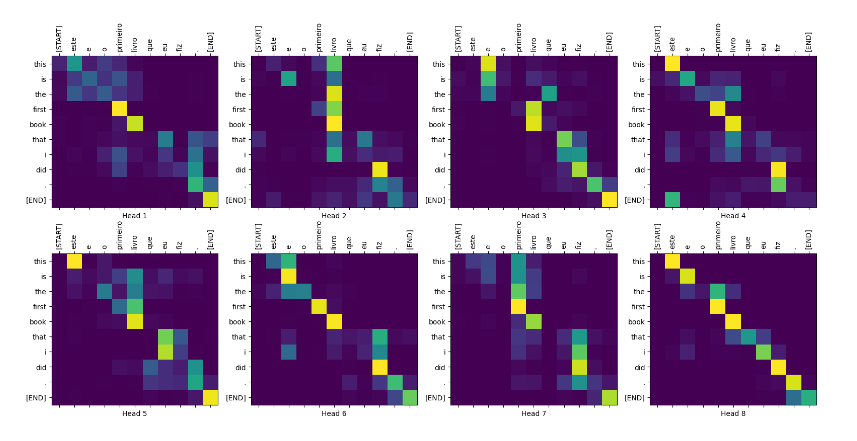

##CONFIGURACIÓN

In [ ]:
!pip install tensorflow_datasets
!pip install -U tensorflow-text

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 65.8 MB/s eta 0:00:00


In [ ]:
import collections
import logging
import os
import pathlib
import re
import string
import sys
import time

import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds
import tensorflow_text as text
import tensorflow as tf

In [ ]:
logging.getLogger('tensorflow').setLevel(logging.ERROR)  # suppress warnings

## dataset

In [ ]:
examples, metadata = tfds.load('ted_hrlr_translate/pt_to_en', with_info=True,
                               as_supervised=True)
train_examples, val_examples = examples['train'], examples['validation']

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/ted_hrlr_translate/pt_to_en/1.0.0.incompleteHS5TAP/ted_hrlr_translate-trai…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/ted_hrlr_translate/pt_to_en/1.0.0.incompleteHS5TAP/ted_hrlr_translate-vali…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/ted_hrlr_translate/pt_to_en/1.0.0.incompleteHS5TAP/ted_hrlr_translate-test…

Dataset ted_hrlr_translate downloaded and prepared to /root/tensorflow_datasets/ted_hrlr_translate/pt_to_en/1.0.0. Subsequent calls will reuse this data.


El objeto tf.data.Dataset devuelto por los conjuntos de datos de TensorFlow produce pares de ejemplos de texto:

In [ ]:
for pt_examples, en_examples in train_examples.batch(3).take(1):
  for pt in pt_examples.numpy():
    print(pt.decode('utf-8'))

  print()

  for en in en_examples.numpy():
    print(en.decode('utf-8'))

e quando melhoramos a procura , tiramos a única vantagem da impressão , que é a serendipidade .
mas e se estes fatores fossem ativos ?
mas eles não tinham a curiosidade de me testar .

and when you improve searchability , you actually take away the one advantage of print , which is serendipity .
but what if it were active ?
but they did n't test for curiosity .


##Tokenización y detokenización de texto

No puede entrenar un modelo directamente en el texto. El texto debe convertirse primero en alguna representación numérica. Por lo general, convierte el texto en secuencias de identificadores de token, que se utilizan como índices en una incrustación.

Una implementación popular se demuestra en el tutorial del tokenizador de subpalabras que crea tokenizadores de subpalabras ( text.BertTokenizer ) optimizados para este conjunto de datos y los exporta en un modelo guardado .

Descargue, descomprima e importe el saved_model :

In [ ]:
model_name = "ted_hrlr_translate_pt_en_converter"
tf.keras.utils.get_file(
    f"{model_name}.zip",
    f"https://storage.googleapis.com/download.tensorflow.org/models/{model_name}.zip",
    cache_dir='.', cache_subdir='', extract=True
)

184801/184801 [==============================] - 0s 0us/step


'./ted_hrlr_translate_pt_en_converter.zip'

In [ ]:
tokenizers = tf.saved_model.load(model_name)

El tf.saved_model contiene dos tokenizadores de texto, uno para inglés y otro para portugués. Ambos tienen los mismos métodos:

In [ ]:
[item for item in dir(tokenizers.en) if not item.startswith('_')]

['detokenize',
 'get_reserved_tokens',
 'get_vocab_path',
 'get_vocab_size',
 'lookup',
 'tokenize',
 'tokenizer',
 'vocab']

El método tokenize convierte un lote de cadenas en un lote con relleno de identificadores de token. Este método divide la puntuación, las minúsculas y Unicode: normaliza la entrada antes de tokenizarla. Esa estandarización no es visible aquí porque los datos de entrada ya están estandarizados.

In [ ]:
for en in en_examples.numpy():
  print(en.decode('utf-8'))

and when you improve searchability , you actually take away the one advantage of print , which is serendipity .
but what if it were active ?
but they did n't test for curiosity .


In [ ]:
encoded = tokenizers.en.tokenize(en_examples)

for row in encoded.to_list():
  print(row)

[2, 72, 117, 79, 1259, 1491, 2362, 13, 79, 150, 184, 311, 71, 103, 2308, 74, 2679, 13, 148, 80, 55, 4840, 1434, 2423, 540, 15, 3]
[2, 87, 90, 107, 76, 129, 1852, 30, 3]
[2, 87, 83, 149, 50, 9, 56, 664, 85, 2512, 15, 3]


El método de eliminación de detokenize intenta convertir estos identificadores de token nuevamente en texto legible por humanos:

In [ ]:
round_trip = tokenizers.en.detokenize(encoded)
for line in round_trip.numpy():
  print(line.decode('utf-8'))

and when you improve searchability , you actually take away the one advantage of print , which is serendipity .
but what if it were active ?
but they did n ' t test for curiosity .


El método de lookup de nivel inferior convierte ID de token en texto de token:

In [ ]:
tokens = tokenizers.en.lookup(encoded)
tokens

<tf.RaggedTensor [[b'[START]', b'and', b'when', b'you', b'improve', b'search', b'##ability',
  b',', b'you', b'actually', b'take', b'away', b'the', b'one', b'advantage',
  b'of', b'print', b',', b'which', b'is', b's', b'##ere', b'##nd', b'##ip',
  b'##ity', b'.', b'[END]']                                                 ,
 [b'[START]', b'but', b'what', b'if', b'it', b'were', b'active', b'?',
  b'[END]']                                                           ,
 [b'[START]', b'but', b'they', b'did', b'n', b"'", b't', b'test', b'for',
  b'curiosity', b'.', b'[END]']                                          ]>

Aquí puede ver el aspecto de "subpalabra" de los tokenizadores. La palabra "capacidad de búsqueda" se descompone en "capacidad de búsqueda" y la palabra "serendipity" en "s ##ere ##nd ##ip ##ity"

##Configurar tubería de entrada

Para crear una canalización de entrada adecuada para el entrenamiento, aplicará algunas transformaciones al conjunto de datos.

Esta función se utilizará para codificar los lotes de texto sin procesar:

In [ ]:
def tokenize_pairs(pt, en):
    pt = tokenizers.pt.tokenize(pt)
    # Convert from ragged to dense, padding with zeros.
    pt = pt.to_tensor()

    en = tokenizers.en.tokenize(en)
    # Convert from ragged to dense, padding with zeros.
    en = en.to_tensor()
    return pt, en

Aquí hay una canalización de entrada simple que procesa, mezcla y agrupa los datos:

In [ ]:
BUFFER_SIZE = 20000
BATCH_SIZE = 64

In [ ]:
def make_batches(ds):
  return (
      ds
      .cache()
      .shuffle(BUFFER_SIZE)
      .batch(BATCH_SIZE)
      .map(tokenize_pairs, num_parallel_calls=tf.data.AUTOTUNE)
      .prefetch(tf.data.AUTOTUNE))


train_batches = make_batches(train_examples)
val_batches = make_batches(val_examples)

##Codificación posicional

Las capas de atención ven su entrada como un conjunto de vectores, sin orden secuencial. Este modelo tampoco contiene capas recurrentes o convolucionales. Debido a esto, se agrega una "codificación posicional" para dar al modelo alguna información sobre la posición relativa de los tokens en la oración.

El vector de codificación posicional se agrega al vector de incrustación. Las incrustaciones representan un token en un espacio d-dimensional donde los tokens con un significado similar estarán más cerca unos de otros. Pero las incrustaciones no codifican la posición relativa de los tokens en una oración. Entonces, después de agregar la codificación posicional, los tokens estarán más cerca entre sí en función de la similitud de su significado y su posición en la oración , en el espacio d-dimensional.

La fórmula para calcular la codificación posicional es la siguiente:



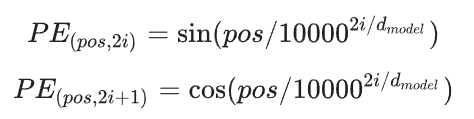

In [ ]:
def get_angles(pos, i, d_model):
  angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
  return pos * angle_rates

In [ ]:
def positional_encoding(position, d_model):
  angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)

  # apply sin to even indices in the array; 2i
  angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

  # apply cos to odd indices in the array; 2i+1
  angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

  pos_encoding = angle_rads[np.newaxis, ...]

  return tf.cast(pos_encoding, dtype=tf.float32)

(1, 2048, 512)


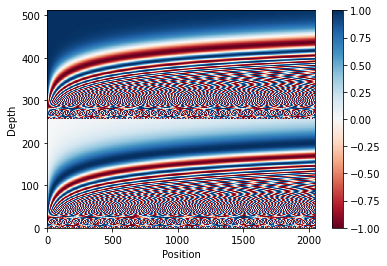

In [ ]:
n, d = 2048, 512
pos_encoding = positional_encoding(n, d)
print(pos_encoding.shape)
pos_encoding = pos_encoding[0]

# Juggle the dimensions for the plot
pos_encoding = tf.reshape(pos_encoding, (n, d//2, 2))
pos_encoding = tf.transpose(pos_encoding, (2, 1, 0))
pos_encoding = tf.reshape(pos_encoding, (d, n))

plt.pcolormesh(pos_encoding, cmap='RdBu')
plt.ylabel('Depth')
plt.xlabel('Position')
plt.colorbar()
plt.show()

##Enmascaramiento

Enmascare todas las fichas de pad en el lote de secuencia. Asegura que el modelo no trate el relleno como la entrada. La máscara indica dónde está presente el valor de almohadilla 0 : genera un 1 en esas ubicaciones y un 0 en caso contrario.

In [ ]:
def create_padding_mask(seq):
  seq = tf.cast(tf.math.equal(seq, 0), tf.float32)

  # add extra dimensions to add the padding
  # to the attention logits.
  return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [ ]:
x = tf.constant([[7, 6, 0, 0, 1], [1, 2, 3, 0, 0], [0, 0, 0, 4, 5]])
create_padding_mask(x)

<tf.Tensor: shape=(3, 1, 1, 5), dtype=float32, numpy=
array([[[[0., 0., 1., 1., 0.]]],


       [[[0., 0., 0., 1., 1.]]],


       [[[1., 1., 1., 0., 0.]]]], dtype=float32)>

La máscara de anticipación se utiliza para enmascarar los tokens futuros en una secuencia. En otras palabras, la máscara indica qué entradas no deben utilizarse.

Esto significa que para predecir el tercer token, solo se usarán el primer y el segundo token. De manera similar, para predecir el cuarto token, solo se usarán el primero, el segundo y el tercer token, y así sucesivamente.

In [ ]:
def create_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

In [ ]:
x = tf.random.uniform((1, 3))
temp = create_look_ahead_mask(x.shape[1])
temp

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[0., 1., 1.],
       [0., 0., 1.],
       [0., 0., 0.]], dtype=float32)>

##Atención de producto punto escalado

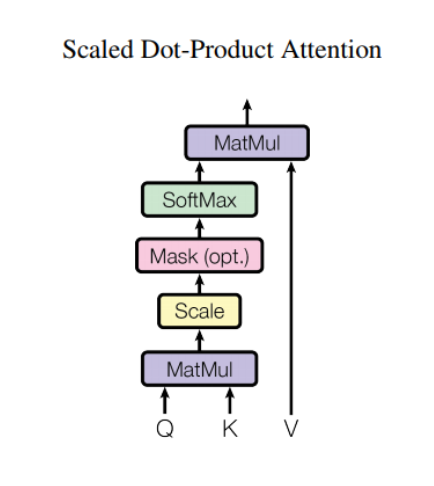

La función de atención que utiliza el transformador toma tres entradas: Q (consulta), K (clave), V (valor). La ecuación utilizada para calcular los pesos de atención es:

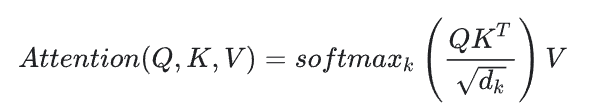

La atención del producto escalar se escala por un factor de raíz cuadrada de la profundidad. Esto se hace porque para valores grandes de profundidad, el producto escalar crece en magnitud empujando la función softmax donde tiene pequeños gradientes que dan como resultado un softmax muy duro.

Por ejemplo, considere que Q y K tienen una media de 0 y una varianza de 1. Su multiplicación de matrices tendrá una media de 0 y una varianza de dk . Entonces, la raíz cuadrada de dk se usa para escalar, por lo que obtiene una variación constante independientemente del valor de dk . Si la varianza es demasiado baja, la salida puede ser demasiado plana para optimizarla de manera efectiva. Si la varianza es demasiado alta, el softmax puede saturarse en la inicialización, lo que dificulta el aprendizaje.

La máscara se multiplica por -1e9 (cerca del infinito negativo). Esto se hace porque la máscara se suma con la multiplicación de matriz escalada de Q y K y se aplica inmediatamente antes de un softmax. El objetivo es poner a cero estas celdas, y las entradas negativas grandes a softmax están cerca de cero en la salida.

In [ ]:
def scaled_dot_product_attention(q, k, v, mask):
  """Calculate the attention weights.
  q, k, v must have matching leading dimensions.
  k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
  The mask has different shapes depending on its type(padding or look ahead)
  but it must be broadcastable for addition.

  Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable
          to (..., seq_len_q, seq_len_k). Defaults to None.

  Returns:
    output, attention_weights
  """

  matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)

  # scale matmul_qk
  dk = tf.cast(tf.shape(k)[-1], tf.float32)
  scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

  # add the mask to the scaled tensor.
  if mask is not None:
    scaled_attention_logits += (mask * -1e9)

  # softmax is normalized on the last axis (seq_len_k) so that the scores
  # add up to 1.
  attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

  output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

  return output, attention_weights

Como la normalización softmax se realiza en K, sus valores deciden la importancia que se le da a Q.

La salida representa la multiplicación de los pesos de atención y el vector V (valor). Esto garantiza que los tokens en los que desea centrarse se mantengan tal cual y los tokens irrelevantes se eliminen.

In [ ]:
def print_out(q, k, v):
  temp_out, temp_attn = scaled_dot_product_attention(
      q, k, v, None)
  print('Attention weights are:')
  print(temp_attn)
  print('Output is:')
  print(temp_out)

In [ ]:
np.set_printoptions(suppress=True)

temp_k = tf.constant([[10, 0, 0],
                      [0, 10, 0],
                      [0, 0, 10],
                      [0, 0, 10]], dtype=tf.float32)  # (4, 3)

temp_v = tf.constant([[1, 0],
                      [10, 0],
                      [100, 5],
                      [1000, 6]], dtype=tf.float32)  # (4, 2)

# This `query` aligns with the second `key`,
# so the second `value` is returned.
temp_q = tf.constant([[0, 10, 0]], dtype=tf.float32)  # (1, 3)
print_out(temp_q, temp_k, temp_v)

Attention weights are:
tf.Tensor([[0. 1. 0. 0.]], shape=(1, 4), dtype=float32)
Output is:
tf.Tensor([[10.  0.]], shape=(1, 2), dtype=float32)


In [ ]:
# This query aligns with a repeated key (third and fourth),
# so all associated values get averaged.
temp_q = tf.constant([[0, 0, 10]], dtype=tf.float32)  # (1, 3)
print_out(temp_q, temp_k, temp_v)

Attention weights are:
tf.Tensor([[0.  0.  0.5 0.5]], shape=(1, 4), dtype=float32)
Output is:
tf.Tensor([[550.    5.5]], shape=(1, 2), dtype=float32)


In [ ]:
# This query aligns equally with the first and second key,
# so their values get averaged.
temp_q = tf.constant([[10, 10, 0]], dtype=tf.float32)  # (1, 3)
print_out(temp_q, temp_k, temp_v)

Attention weights are:
tf.Tensor([[0.5 0.5 0.  0. ]], shape=(1, 4), dtype=float32)
Output is:
tf.Tensor([[5.5 0. ]], shape=(1, 2), dtype=float32)


Pasar todas las consultas juntas.

In [ ]:
temp_q = tf.constant([[0, 0, 10],
                      [0, 10, 0],
                      [10, 10, 0]], dtype=tf.float32)  # (3, 3)
print_out(temp_q, temp_k, temp_v)

Attention weights are:
tf.Tensor(
[[0.  0.  0.5 0.5]
 [0.  1.  0.  0. ]
 [0.5 0.5 0.  0. ]], shape=(3, 4), dtype=float32)
Output is:
tf.Tensor(
[[550.    5.5]
 [ 10.    0. ]
 [  5.5   0. ]], shape=(3, 2), dtype=float32)


##Atención de múltiples cabezas

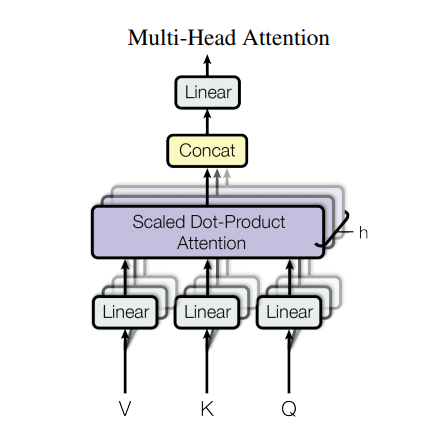

La atención de múltiples cabezas consta de cuatro partes:

- Capas lineales.
- Atención de producto punto escalado.
- Capa lineal final.

Cada bloque de atención de varios cabezales recibe tres entradas; Q (consulta), K (clave), V (valor). Estos se pasan por capas lineales (Densas) antes de la función de atención de múltiples cabezas.

En el diagrama de arriba (K,Q,V) se pasan a través de capas lineales separadas ( Dense ) para cada cabeza de atención. Para simplificar/eficacia, el siguiente código implementa esto usando una sola capa densa con num_heads veces tantas salidas. La salida se reorganiza a una forma de (batch, num_heads, ...) antes de aplicar la función de atención.

La función scaled_dot_product_attention definida anteriormente se aplica en una sola llamada, transmitida por eficiencia. Se debe utilizar una máscara adecuada en el paso de atención. La salida de atención para cada cabeza luego se concatena (usando tf.transpose y tf.reshape ) y se pasa por una capa Dense final.

En lugar de una sola cabeza de atención, Q, K y V se dividen en múltiples cabezas porque permite que el modelo atienda conjuntamente la información de diferentes subespacios de representación en diferentes posiciones. Después de la división, cada cabeza tiene una dimensionalidad reducida, por lo que el costo total de cómputo es el mismo que el de la atención de una sola cabeza con dimensionalidad completa.

In [ ]:
class MultiHeadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiHeadAttention, self).__init__()
    self.num_heads = num_heads
    self.d_model = d_model

    assert d_model % self.num_heads == 0

    self.depth = d_model // self.num_heads

    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)

    self.dense = tf.keras.layers.Dense(d_model)

  def split_heads(self, x, batch_size):
    """Split the last dimension into (num_heads, depth).
    Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
    """
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0, 2, 1, 3])

  def call(self, v, k, q, mask):
    batch_size = tf.shape(q)[0]

    q = self.wq(q)  # (batch_size, seq_len, d_model)
    k = self.wk(k)  # (batch_size, seq_len, d_model)
    v = self.wv(v)  # (batch_size, seq_len, d_model)

    q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
    k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
    v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)

    # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
    # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
    scaled_attention, attention_weights = scaled_dot_product_attention(
        q, k, v, mask)

    scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

    concat_attention = tf.reshape(scaled_attention,
                                  (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

    output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)

    return output, attention_weights

Cree una capa MultiHeadAttention para probar. En cada ubicación de la secuencia, y , MultiHeadAttention ejecuta las 8 cabezas de atención en todas las demás ubicaciones de la secuencia, devolviendo un nuevo vector de la misma longitud en cada ubicación.

In [ ]:
temp_mha = MultiHeadAttention(d_model=512, num_heads=8)
y = tf.random.uniform((1, 60, 512))  # (batch_size, encoder_sequence, d_model)
out, attn = temp_mha(y, k=y, q=y, mask=None)
out.shape, attn.shape

(TensorShape([1, 60, 512]), TensorShape([1, 8, 60, 60]))

##Red de retroalimentación de puntos sabios

La red de retroalimentación puntual consta de dos capas completamente conectadas con una activación de ReLU en el medio.

In [ ]:
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [ ]:
sample_ffn = point_wise_feed_forward_network(512, 2048)
sample_ffn(tf.random.uniform((64, 50, 512))).shape

TensorShape([64, 50, 512])

##Codificador y decodificador

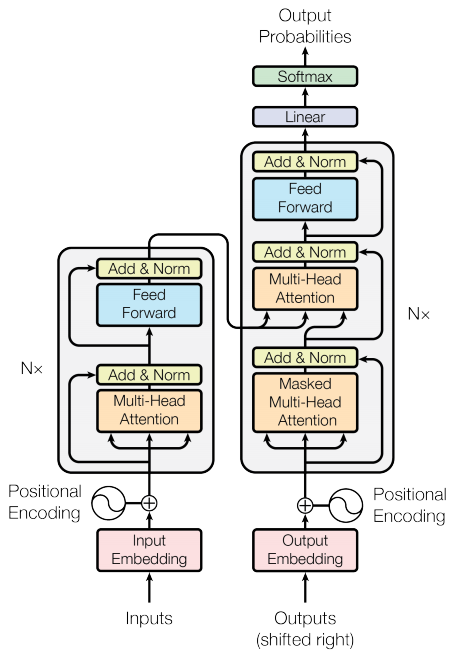

El modelo transformador sigue el mismo patrón general que un modelo estándar de secuencia a secuencia con atención .

- La oración de entrada se pasa a través de N capas de codificador que generan una salida para cada token en la secuencia.
- El decodificador atiende a la salida del codificador ya su propia entrada (autoatención) para predecir la siguiente palabra.

##Capa de codificador

Cada capa de codificador consta de subcapas:

1. Atención multicabezal (con máscara de relleno)
2. Redes de alimentación hacia adelante inteligentes.

Cada una de estas subcapas tiene una conexión residual a su alrededor seguida de una normalización de capa. Las conexiones residuales ayudan a evitar el problema del gradiente de fuga en las redes profundas.

La salida de cada subcapa es LayerNorm(x + Sublayer(x)) . La normalización se realiza en el d_model (último). Hay N capas de codificador en el transformador.

In [ ]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiHeadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)

  def call(self, x, training, mask):

    attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)

    ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)

    return out2

In [ ]:
sample_encoder_layer = EncoderLayer(512, 8, 2048)

sample_encoder_layer_output = sample_encoder_layer(
    tf.random.uniform((64, 43, 512)), False, None)

sample_encoder_layer_output.shape  # (batch_size, input_seq_len, d_model)

TensorShape([64, 43, 512])

##Capa decodificador

Cada capa de decodificador consta de subcapas:

1. Atención multicabezal enmascarada (con máscara de anticipación y máscara de relleno)
2. Atención multicabezal (con máscara de relleno). V (valor) y K (clave) reciben la salida del codificador como entradas. Q (consulta) recibe la salida de la subcapa de atención de múltiples cabezas enmascarada.
3. Redes de feed-forward de punto sabio

Cada una de estas subcapas tiene una conexión residual a su alrededor seguida de una normalización de capa. La salida de cada subcapa es LayerNorm(x + Sublayer(x)) . La normalización se realiza en el d_model (último).

Hay N capas de decodificador en el transformador.

Como Q recibe la salida del primer bloque de atención del decodificador y K recibe la salida del codificador, los pesos de atención representan la importancia otorgada a la entrada del decodificador en función de la salida del codificador. En otras palabras, el decodificador predice el próximo token mirando la salida del codificador y atendiendo automáticamente a su propia salida. Vea la demostración anterior en la sección de atención del producto escalar escalado.

In [ ]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiHeadAttention(d_model, num_heads)
    self.mha2 = MultiHeadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)

  def call(self, x, enc_output, training,
           look_ahead_mask, padding_mask):
    # enc_output.shape == (batch_size, input_seq_len, d_model)

    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)

    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)

    ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)

    return out3, attn_weights_block1, attn_weights_block2

In [ ]:
sample_decoder_layer = DecoderLayer(512, 8, 2048)

sample_decoder_layer_output, _, _ = sample_decoder_layer(
    tf.random.uniform((64, 50, 512)), sample_encoder_layer_output,
    False, None, None)

sample_decoder_layer_output.shape  # (batch_size, target_seq_len, d_model)

TensorShape([64, 50, 512])

##codificador

El Encoder consta de:

1. Incrustación de entrada
2. Codificación posicional
3. N capas de codificador

La entrada se somete a una incrustación que se suma con la codificación posicional. La salida de esta suma es la entrada a las capas del codificador. La salida del codificador es la entrada al decodificador.

In [ ]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.embedding = tf.keras.layers.Embedding(input_vocab_size, d_model)
    self.pos_encoding = positional_encoding(maximum_position_encoding,
                                            self.d_model)

    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate)
                       for _ in range(num_layers)]

    self.dropout = tf.keras.layers.Dropout(rate)

  def call(self, x, training, mask):

    seq_len = tf.shape(x)[1]

    # adding embedding and position encoding.
    x = self.embedding(x)  # (batch_size, input_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask)

    return x  # (batch_size, input_seq_len, d_model)

In [ ]:
sample_encoder = Encoder(num_layers=2, d_model=512, num_heads=8,
                         dff=2048, input_vocab_size=8500,
                         maximum_position_encoding=10000)
temp_input = tf.random.uniform((64, 62), dtype=tf.int64, minval=0, maxval=200)

sample_encoder_output = sample_encoder(temp_input, training=False, mask=None)

print(sample_encoder_output.shape)  # (batch_size, input_seq_len, d_model)

(64, 62, 512)


##Descifrador

El Decoder consta de:

1. Incrustación de salida
2. Codificación posicional
3. N capas de decodificador

El objetivo se somete a una incrustación que se suma con la codificación posicional. La salida de esta suma es la entrada a las capas del decodificador. La salida del decodificador es la entrada a la capa lineal final.

In [ ]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)

    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate)
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)

  def call(self, x, enc_output, training,
           look_ahead_mask, padding_mask):

    seq_len = tf.shape(x)[1]
    attention_weights = {}

    x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)

      attention_weights[f'decoder_layer{i+1}_block1'] = block1
      attention_weights[f'decoder_layer{i+1}_block2'] = block2

    # x.shape == (batch_size, target_seq_len, d_model)
    return x, attention_weights

In [ ]:
sample_decoder = Decoder(num_layers=2, d_model=512, num_heads=8,
                         dff=2048, target_vocab_size=8000,
                         maximum_position_encoding=5000)
temp_input = tf.random.uniform((64, 26), dtype=tf.int64, minval=0, maxval=200)

output, attn = sample_decoder(temp_input,
                              enc_output=sample_encoder_output,
                              training=False,
                              look_ahead_mask=None,
                              padding_mask=None)

output.shape, attn['decoder_layer2_block2'].shape

(TensorShape([64, 26, 512]), TensorShape([64, 8, 26, 62]))

##Crea el transformador

El transformador consta del codificador, el decodificador y una capa lineal final. La salida del decodificador es la entrada a la capa lineal y se devuelve su salida.

In [ ]:
class Transformer(tf.keras.Model):
  def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size,
               target_vocab_size, pe_input, pe_target, rate=0.1):
    super().__init__()
    self.encoder = Encoder(num_layers, d_model, num_heads, dff,
                             input_vocab_size, pe_input, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff,
                           target_vocab_size, pe_target, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)

  def call(self, inputs, training):
    # Keras models prefer if you pass all your inputs in the first argument
    inp, tar = inputs

    enc_padding_mask, look_ahead_mask, dec_padding_mask = self.create_masks(inp, tar)

    enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)

    # dec_output.shape == (batch_size, tar_seq_len, d_model)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)

    final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)

    return final_output, attention_weights

  def create_masks(self, inp, tar):
    # Encoder padding mask
    enc_padding_mask = create_padding_mask(inp)

    # Used in the 2nd attention block in the decoder.
    # This padding mask is used to mask the encoder outputs.
    dec_padding_mask = create_padding_mask(inp)

    # Used in the 1st attention block in the decoder.
    # It is used to pad and mask future tokens in the input received by
    # the decoder.
    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    look_ahead_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)

    return enc_padding_mask, look_ahead_mask, dec_padding_mask

In [ ]:
sample_transformer = Transformer(
    num_layers=2, d_model=512, num_heads=8, dff=2048,
    input_vocab_size=8500, target_vocab_size=8000,
    pe_input=10000, pe_target=6000)

temp_input = tf.random.uniform((64, 38), dtype=tf.int64, minval=0, maxval=200)
temp_target = tf.random.uniform((64, 36), dtype=tf.int64, minval=0, maxval=200)

fn_out, _ = sample_transformer([temp_input, temp_target], training=False)

fn_out.shape  # (batch_size, tar_seq_len, target_vocab_size)

TensorShape([64, 36, 8000])

##Establecer hiperparámetros

Para mantener este ejemplo pequeño y relativamente rápido, se han reducido los valores de num_layers, d_model, dff .

El modelo base descrito en el artículo utilizado: num_layers=6, d_model=512, dff=2048 .

In [ ]:
num_layers = 4
d_model = 128
dff = 512
num_heads = 8
dropout_rate = 0.1

##Optimizador

Utilice el optimizador de Adam con un planificador de tasa de aprendizaje personalizado de acuerdo con la fórmula del documento .

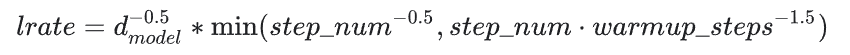

In [ ]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()

    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    step = tf.cast(step, tf.float32)  # Cast step to float32
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)

    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)


In [ ]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,
                                     epsilon=1e-9)



Text(0.5, 0, 'Train Step')

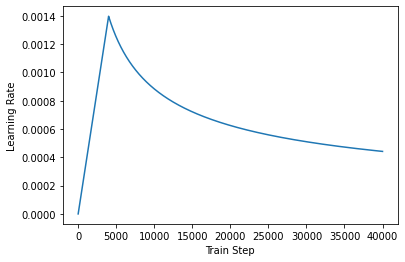

In [ ]:
temp_learning_rate_schedule = CustomSchedule(d_model)

plt.plot(temp_learning_rate_schedule(tf.range(40000, dtype=tf.float32)))
plt.ylabel("Learning Rate")
plt.xlabel("Train Step")

##Pérdida y métricas

Dado que las secuencias de destino se rellenan, es importante aplicar una máscara de relleno al calcular la pérdida.

In [ ]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_sum(loss_)/tf.reduce_sum(mask)


def accuracy_function(real, pred):
  accuracies = tf.equal(real, tf.argmax(pred, axis=2))

  mask = tf.math.logical_not(tf.math.equal(real, 0))
  accuracies = tf.math.logical_and(mask, accuracies)

  accuracies = tf.cast(accuracies, dtype=tf.float32)
  mask = tf.cast(mask, dtype=tf.float32)
  return tf.reduce_sum(accuracies)/tf.reduce_sum(mask)

In [ ]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.Mean(name='train_accuracy')

##Formación y control

In [ ]:
transformer = Transformer(
    num_layers=num_layers,
    d_model=d_model,
    num_heads=num_heads,
    dff=dff,
    input_vocab_size=tokenizers.pt.get_vocab_size().numpy(),
    target_vocab_size=tokenizers.en.get_vocab_size().numpy(),
    pe_input=1000,
    pe_target=1000,
    rate=dropout_rate)

Cree la ruta del punto de control y el administrador del punto de control. Esto se usará para guardar puntos de control cada n épocas.

In [ ]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(transformer=transformer,
                           optimizer=optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print('Latest checkpoint restored!!')

El objetivo se divide en tar_inp y tar_real. tar_inp se pasa como entrada al decodificador. tar_real es esa misma entrada desplazada por 1: en cada ubicación en tar_input , tar_real contiene el siguiente token que debe predecirse.

Por ejemplo, sentence = "SOS Un león en la jungla está durmiendo EOS"

tar_inp = "SOS Un león en la selva está durmiendo"

tar_real = "Un león en la jungla está durmiendo EOS"

El transformador es un modelo autorregresivo: hace predicciones una parte a la vez y usa su salida hasta el momento para decidir qué hacer a continuación.

Durante el entrenamiento, este ejemplo utiliza la fuerza del maestro (como en el tutorial de generación de texto ). La fuerza del profesor pasa la salida real al siguiente paso de tiempo, independientemente de lo que prediga el modelo en el paso de tiempo actual.

A medida que el transformador predice cada token, la autoatención le permite observar los tokens anteriores en la secuencia de entrada para predecir mejor el siguiente token.

Para evitar que el modelo eche un vistazo a la salida esperada, el modelo utiliza una máscara de anticipación.

In [ ]:
EPOCHS = 20

In [ ]:
# The @tf.function trace-compiles train_step into a TF graph for faster
# execution. The function specializes to the precise shape of the argument
# tensors. To avoid re-tracing due to the variable sequence lengths or variable
# batch sizes (the last batch is smaller), use input_signature to specify
# more generic shapes.

train_step_signature = [
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
]


@tf.function(input_signature=train_step_signature)
def train_step(inp, tar):
  tar_inp = tar[:, :-1]
  tar_real = tar[:, 1:]

  with tf.GradientTape() as tape:
    predictions, _ = transformer([inp, tar_inp],
                                 training = True)
    loss = loss_function(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))

  train_loss(loss)
  train_accuracy(accuracy_function(tar_real, predictions))

El portugués se utiliza como idioma de entrada y el inglés es el idioma de destino.

In [ ]:
for epoch in range(EPOCHS):
  start = time.time()

  train_loss.reset_states()
  train_accuracy.reset_states()

  # inp -> portuguese, tar -> english
  for (batch, (inp, tar)) in enumerate(train_batches):
    train_step(inp, tar)

    if batch % 50 == 0:
      print(f'Epoch {epoch + 1} Batch {batch} Loss {train_loss.result():.4f} Accuracy {train_accuracy.result():.4f}')

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print(f'Saving checkpoint for epoch {epoch+1} at {ckpt_save_path}')

  print(f'Epoch {epoch + 1} Loss {train_loss.result():.4f} Accuracy {train_accuracy.result():.4f}')

  print(f'Time taken for 1 epoch: {time.time() - start:.2f} secs\n')

Epoch 1 Batch 0 Loss 8.8408 Accuracy 0.0007
Epoch 1 Batch 50 Loss 8.7977 Accuracy 0.0006
Epoch 1 Batch 100 Loss 8.7060 Accuracy 0.0122
Epoch 1 Batch 150 Loss 8.5932 Accuracy 0.0269
Epoch 1 Batch 200 Loss 8.4526 Accuracy 0.0359
Epoch 1 Batch 250 Loss 8.2838 Accuracy 0.0432
Epoch 1 Batch 300 Loss 8.0947 Accuracy 0.0517
Epoch 1 Batch 350 Loss 7.8968 Accuracy 0.0608
Epoch 1 Batch 400 Loss 7.7093 Accuracy 0.0687
Epoch 1 Batch 450 Loss 7.5424 Accuracy 0.0760
Epoch 1 Batch 500 Loss 7.3940 Accuracy 0.0826
Epoch 1 Batch 550 Loss 7.2561 Accuracy 0.0901
Epoch 1 Batch 600 Loss 7.1306 Accuracy 0.0975
Epoch 1 Batch 650 Loss 7.0112 Accuracy 0.1045
Epoch 1 Batch 700 Loss 6.9005 Accuracy 0.1109
Epoch 1 Batch 750 Loss 6.7995 Accuracy 0.1169
Epoch 1 Batch 800 Loss 6.7036 Accuracy 0.1227
Epoch 1 Loss 6.6872 Accuracy 0.1238
Time taken for 1 epoch: 218.40 secs

Epoch 2 Batch 0 Loss 4.8821 Accuracy 0.2467
Epoch 2 Batch 50 Loss 5.1862 Accuracy 0.2165
Epoch 2 Batch 100 Loss 5.1449 Accuracy 0.2213
Epoch 2 Batch

##Ejecutar inferencia

Ejecutar inferencia
Los siguientes pasos se utilizan para la inferencia:

Codifique la oración de entrada utilizando el tokenizador portugués ( tokenizers.pt ). Esta es la entrada del codificador.
La entrada del decodificador se inicializa en el token [START] .
Calcule las máscaras de relleno y las máscaras anticipadas.
Luego, el decoder emite las predicciones mirando la encoder output y su propia salida (autoatención).
Concatene el token predicho a la entrada del decodificador y páselo al decodificador.
En este enfoque, el decodificador predice el siguiente token en función de los tokens anteriores que predijo.

Nota: El modelo está optimizado para un entrenamiento eficiente y hace una predicción del siguiente token para cada token en la salida simultáneamente. Esto es redundante durante la inferencia y solo se usa la última predicción. Este modelo se puede hacer más eficiente para la inferencia si solo calcula la última predicción cuando se ejecuta en modo de inferencia ( training=False ).

In [ ]:
class Translator(tf.Module):
  def __init__(self, tokenizers, transformer):
    self.tokenizers = tokenizers
    self.transformer = transformer

  def __call__(self, sentence, max_length=20):
    # input sentence is portuguese, hence adding the start and end token
    assert isinstance(sentence, tf.Tensor)
    if len(sentence.shape) == 0:
      sentence = sentence[tf.newaxis]

    sentence = self.tokenizers.pt.tokenize(sentence).to_tensor()

    encoder_input = sentence

    # as the target is english, the first token to the transformer should be the
    # english start token.
    start_end = self.tokenizers.en.tokenize([''])[0]
    start = start_end[0][tf.newaxis]
    end = start_end[1][tf.newaxis]

    # `tf.TensorArray` is required here (instead of a python list) so that the
    # dynamic-loop can be traced by `tf.function`.
    output_array = tf.TensorArray(dtype=tf.int64, size=0, dynamic_size=True)
    output_array = output_array.write(0, start)

    for i in tf.range(max_length):
      output = tf.transpose(output_array.stack())
      predictions, _ = self.transformer([encoder_input, output], training=False)

      # select the last token from the seq_len dimension
      predictions = predictions[:, -1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.argmax(predictions, axis=-1)

      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      output_array = output_array.write(i+1, predicted_id[0])

      if predicted_id == end:
        break

    output = tf.transpose(output_array.stack())
    # output.shape (1, tokens)
    text = tokenizers.en.detokenize(output)[0]  # shape: ()

    tokens = tokenizers.en.lookup(output)[0]

    # `tf.function` prevents us from using the attention_weights that were
    # calculated on the last iteration of the loop. So recalculate them outside
    # the loop.
    _, attention_weights = self.transformer([encoder_input, output[:,:-1]], training=False)

    return text, tokens, attention_weights

Cree una instancia de esta clase Translator y pruébela varias veces:

In [ ]:
translator = Translator(tokenizers, transformer)

In [ ]:
def print_translation(sentence, tokens, ground_truth):
  print(f'{"Input:":15s}: {sentence}')
  print(f'{"Prediction":15s}: {tokens.numpy().decode("utf-8")}')
  print(f'{"Ground truth":15s}: {ground_truth}')

In [ ]:
sentence = "este é um problema que temos que resolver."
ground_truth = "this is a problem we have to solve ."

translated_text, translated_tokens, attention_weights = translator(
    tf.constant(sentence))
print_translation(sentence, translated_text, ground_truth)

In [ ]:
sentence = "os meus vizinhos ouviram sobre esta ideia."
ground_truth = "and my neighboring homes heard about this idea ."

translated_text, translated_tokens, attention_weights = translator(
    tf.constant(sentence))
print_translation(sentence, translated_text, ground_truth)

In [ ]:
sentence = "vou então muito rapidamente partilhar convosco algumas histórias de algumas coisas mágicas que aconteceram."
ground_truth = "so i \'ll just share with you some stories very quickly of some magical things that have happened ."

translated_text, translated_tokens, attention_weights = translator(
    tf.constant(sentence))
print_translation(sentence, translated_text, ground_truth)

##Parcelas de atención

La clase Translator devuelve un diccionario de mapas de atención que puede usar para visualizar el funcionamiento interno del modelo:

In [ ]:
sentence = "este é o primeiro livro que eu fiz."
ground_truth = "this is the first book i've ever done."

translated_text, translated_tokens, attention_weights = translator(
    tf.constant(sentence))
print_translation(sentence, translated_text, ground_truth)

In [ ]:
def plot_attention_head(in_tokens, translated_tokens, attention):
  # The plot is of the attention when a token was generated.
  # The model didn't generate `<START>` in the output. Skip it.
  translated_tokens = translated_tokens[1:]

  ax = plt.gca()
  ax.matshow(attention)
  ax.set_xticks(range(len(in_tokens)))
  ax.set_yticks(range(len(translated_tokens)))

  labels = [label.decode('utf-8') for label in in_tokens.numpy()]
  ax.set_xticklabels(
      labels, rotation=90)

  labels = [label.decode('utf-8') for label in translated_tokens.numpy()]
  ax.set_yticklabels(labels)

In [ ]:
head = 0
# shape: (batch=1, num_heads, seq_len_q, seq_len_k)
attention_heads = tf.squeeze(
  attention_weights['decoder_layer4_block2'], 0)
attention = attention_heads[head]
attention.shape

In [ ]:
in_tokens = tf.convert_to_tensor([sentence])
in_tokens = tokenizers.pt.tokenize(in_tokens).to_tensor()
in_tokens = tokenizers.pt.lookup(in_tokens)[0]
in_tokens

In [ ]:
translated_tokens

In [ ]:
def plot_attention_weights(sentence, translated_tokens, attention_heads):
  in_tokens = tf.convert_to_tensor([sentence])
  in_tokens = tokenizers.pt.tokenize(in_tokens).to_tensor()
  in_tokens = tokenizers.pt.lookup(in_tokens)[0]
  in_tokens

  fig = plt.figure(figsize=(16, 8))

  for h, head in enumerate(attention_heads):
    ax = fig.add_subplot(2, 4, h+1)

    plot_attention_head(in_tokens, translated_tokens, head)

    ax.set_xlabel(f'Head {h+1}')

  plt.tight_layout()
  plt.show()

In [ ]:
plot_attention_weights(sentence, translated_tokens,
                       attention_weights['decoder_layer4_block2'][0])

Al modelo le va bien con las palabras desconocidas. Ni "triceratops" ni "enciclopedia" están en el conjunto de datos de entrada y el modelo casi aprende a transliterarlos, incluso sin un vocabulario compartido:

In [ ]:
sentence = "Eu li sobre triceratops na enciclopédia."
ground_truth = "I read about triceratops in the encyclopedia."

translated_text, translated_tokens, attention_weights = translator(
    tf.constant(sentence))
print_translation(sentence, translated_text, ground_truth)

plot_attention_weights(sentence, translated_tokens,
                       attention_weights['decoder_layer4_block2'][0])

##Exportar

Ese modelo de inferencia está funcionando, así que a continuación lo exportará como tf.saved_model .

Para hacer eso, envuélvalo en otra tf.Module , esta vez con una tf.function en el método __call__ :

In [ ]:
class ExportTranslator(tf.Module):
  def __init__(self, translator):
    self.translator = translator

  @tf.function(input_signature=[tf.TensorSpec(shape=[], dtype=tf.string)])
  def __call__(self, sentence):
    (result,
     tokens,
     attention_weights) = self.translator(sentence, max_length=100)

    return result

En la tf.function anterior, solo se devuelve la sentencia de salida. Gracias a la ejecución no estricta en tf.function , los valores innecesarios nunca se calculan.

In [ ]:
translator = ExportTranslator(translator)

Dado que el modelo decodifica las predicciones utilizando tf.argmax las predicciones son deterministas. El modelo original y uno recargado desde su SavedModel deberían dar predicciones idénticas:

In [ ]:
translator("este é o primeiro livro que eu fiz.").numpy()

In [ ]:
tf.saved_model.save(translator, export_dir='translator')

In [ ]:
reloaded = tf.saved_model.load('translator')

In [ ]:
reloaded("este é o primeiro livro que eu fiz.").numpy()

##Resumen

En este tutorial, aprendió sobre la codificación posicional, la atención de varios cabezales, la importancia del enmascaramiento y cómo crear un transformador.

Intente usar un conjunto de datos diferente para entrenar el transformador. También puede crear el transformador base o el transformador XL cambiando los hiperparámetros anteriores. También puede usar las capas definidas aquí para crear BERT y entrenar modelos de última generación. Además, puede implementar la búsqueda de haces para obtener mejores predicciones.

#PALM

#LLAMA FACEBOOK

Se usa los transformers hechos por Vaswani en 2017 en su papper atención es todo lo que necesitas, aunque con modificaciones que se han copiado del modelo de google PALM

#METODOS DE OPTIMIZACIÓN